In [37]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, probplot
from sklearn.preprocessing import QuantileTransformer
from subprocess import check_output
print(check_output(["ls", "./"]).decode("utf8"))

import warnings
warnings.filterwarnings('ignore')

%config Completer.use_jedi = False
%load_ext watermark
%watermark --iversions
    

Indices_all.csv
Indices_all_edited.csv
Revised_indices&climate_variable_analysis.ipynb
_cormatix.pdf
_cormatix.png
babprcp_feature_importance.pdf
babprcp_feature_importance.png
babprcp_td.pdf
babprcp_td.png
babtmax_feature_importance.pdf
babtmax_feature_importance.png
babtmax_td.pdf
babtmax_td.png
babtmin_feature_importance.pdf
babtmin_feature_importance.png
babtmin_td.pdf
babtmin_td.png
boleprcp_feature_importance.pdf
boleprcp_feature_importance.png
boleprcp_td.pdf
boleprcp_td.png
boletmax_feature_importance.pdf
boletmax_feature_importance.png
boletmax_td.pdf
boletmax_td.png
boletmin_feature_importance.pdf
boletmin_feature_importance.png
boletmin_td.pdf
boletmin_td.png
bolgaprcp_feature_importance.pdf
bolgaprcp_feature_importance.png
bolgaprcp_td.pdf
bolgaprcp_td.png
bolgatmax_feature_importance.pdf
bolgatmax_feature_importance.png
bolgatmax_td.pdf
bolgatmax_td.png
bolgatmin_feature_importance.pdf
bolgatmin_feature_importance.png
bolgatmin_td.pdf
bolgatmin_td.png
damprcp_feature_impor

* List all available font families in Matplotlib and choose one that suits your preference

In [38]:
import matplotlib.font_manager

# Get a list of all available font families
font_list = matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')

# Print the list of font families
for font in font_list:
    print(font)


/usr/share/fonts/truetype/noto/NotoSansHebrew-Regular.ttf
/usr/share/fonts/truetype/croscore/Tinos-BoldItalic.ttf
/usr/share/texmf/fonts/opentype/public/lm/lmsans9-oblique.otf
/usr/share/fonts/truetype/noto/NotoSerifTamil-Bold.ttf
/usr/share/fonts/truetype/noto/NotoSansHanunoo-Regular.ttf
/usr/share/fonts/opentype/tlwg/TlwgTypo-BoldOblique.otf
/usr/share/fonts/truetype/croscore/Arimo-Regular.ttf
/usr/share/fonts/opentype/linux-libertine/LinBiolinum_RB.otf
/usr/share/fonts/opentype/tlwg/TlwgMono-Bold.otf
/usr/share/fonts/truetype/arphic-bkai00mp/bkai00mp.ttf
/usr/share/fonts/truetype/noto/NotoSerifTamil-Regular.ttf
/usr/share/fonts/truetype/gentium-basic/GenBkBasBI.ttf
/usr/share/fonts/truetype/neohellenic/GFSNeohellenicBold.otf
/usr/share/fonts/truetype/dejavu/DejaVuSerif.ttf
/usr/share/fonts/truetype/noto/NotoSansMyanmar-Regular.ttf
/usr/share/fonts/truetype/padauk/PadaukBook-Bold.ttf
/usr/share/fonts/opentype/mathjax/MathJax_SansSerif-Italic.otf
/usr/share/fonts/truetype/noto/NotoSan

In [39]:
import matplotlib as mpl
plt.rc("text", usetex=True)

# Specify the font family directly
mpl.rcParams['font.family'] = 'Arial'

In [40]:
import os
# Define the name of the output directory
output_dir = "output_flag_indices"

# Check if the directory already exists
if not os.path.exists(output_dir):
    # If not, create the directory
    os.makedirs(output_dir)
    print(f"Directory '{output_dir}' created successfully.")
else:
    print(f"Directory '{output_dir}' already exists.")

Directory 'output_flag_indices' already exists.


In [41]:
df = pd.read_csv('Indices_all_edited.csv')
df.drop(columns=['Unnamed: 0', 'nino34'], inplace=True)

# Replace all occurrences of 0.0 and -9999 with NaNs
df.replace({0.0: np.nan, 9999.0: np.nan}, inplace=True)
# df_ = df.copy()
df.head(n=100)

,amm,amo,nao,nino_1_2,nino_3,nino_4,nino3_4,pna,soi,tna,...,boletmin,babprcp,babtmax,babtmin,navprcp,navtmax,navtmin,damprcp,damtmax,damtmin
0,1.1,0.2,-0.6,-0.8,-0.6,-0.6,-0.4,0.4,0.8,0.1,...,20.4,1145.6,34.1,21.3,1039.8,34.5,22.5,1195.0,33.5,21.3
1,0.7,0.1,NaN,-0.8,-0.7,-0.6,-0.5,-0.1,0.3,NaN,...,18.9,872.4,33.1,19.0,817.8,34.3,22.0,759.0,32.7,20.8
2,2.0,NaN,-0.4,-1.2,-0.8,-0.7,-0.7,-0.4,0.9,0.2,...,20.3,1095.7,33.8,21.2,890.7,34.1,22.4,1211.0,33.4,21.5
3,-0.5,NaN,-0.6,-0.5,0.1,-0.3,0.2,-0.1,-0.1,0.2,...,20.4,1193.7,33.9,20.7,1244.1,34.3,22.1,1527.0,33.7,21.0
4,0.4,-0.1,-0.2,-1.5,-1.1,-1.0,-0.8,-0.3,1.0,NaN,...,20.3,NaN,34.1,20.9,923.2,34.3,22.2,979.0,33.1,21.7
5,-1.8,-0.2,-0.2,0.6,0.4,-0.2,0.4,-0.3,-0.8,-0.2,...,19.9,NaN,34.1,20.5,962.2,34.7,21.9,1331.0,33.2,21.7
6,1.1,NaN,-0.5,-1.0,-0.5,0.1,NaN,-0.4,-0.4,0.2,...,20.1,NaN,33.8,20.6,976.4,34.7,21.9,243.0,33.7,21.0
7,NaN,-0.1,0.3,-1.2,-0.9,-0.4,-0.6,-0.7,0.8,-0.1,...,20.4,NaN,34.2,20.6,863.0,34.7,22.2,772.0,31.5,20.4
8,-0.8,-0.2,-1.0,-0.9,-0.6,-0.2,-0.2,-0.1,0.6,-0.1,...,20.5,NaN,33.9,20.8,1081.3,34.7,22.2,1208.0,33.1,21.8
9,1.8,NaN,-0.2,0.4,0.4,0.4,0.4,0.2,-0.6,0.5,...,20.6,1043.3,33.4,21.3,1079.4,34.7,22.2,NaN,33.6,21.4


* Visualizing Missing Data

<Figure size 3600x1440 with 0 Axes>

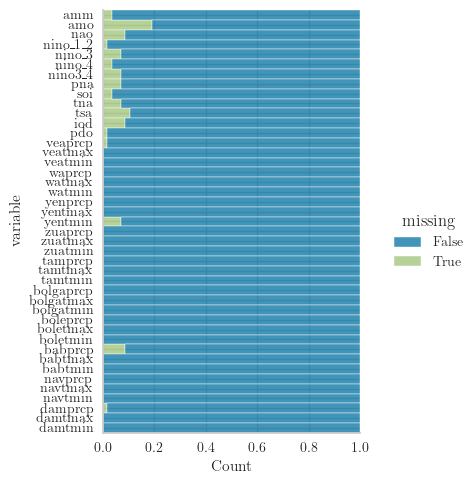

In [42]:
plt.figure(figsize=(20,8), dpi=180)
sns.displot(
    data=df.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=0.8
)
# plt.savefig("mis_distplot.png", dpi=100)

* Fill in missing

In [43]:
import pandas as pd
import numpy as np
import seaborn as sns
import miceforest as mf
import random
import sklearn.neighbors._base 
import sys
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest
from sklearn.impute import KNNImputer

def impute_data(df_):
    '''
    This function `impute_data()` takes a DataFrame df_ as input, replaces 0.0 and -9999 with NaNs,
    and then performs MICE, Miss Forest, and KNN imputation techniques. 
    Finally, it returns the completed datasets for each imputation technique.
    '''
    # Replace 0.0 and -9999 with NaNs
    df_.replace({0.0: np.nan, -9999: np.nan}, inplace=True)
    
    # Now, we will use each of the three techniques to impute data.
    
    # Create kernels.  #mice forest
    kernel = mf.ImputationKernel(
      data=df_.iloc[:,:],
      save_all_iterations=True,
      random_state=1343
    )
    print('Performing miceForest imputation ... \n') 
    kernel.mice(iterations=100, verbose=True)
    completed_dataset = kernel.complete_data(dataset=0, inplace=False)

    # Miss Forest
    imputer = MissForest(max_iter=100,
                        decreasing=False,
                        missing_values=np.nan,
                        copy=True,
                        n_estimators=100,
                        criterion=('mse', 'gini'),
                        max_depth=None,
                        min_samples_split=3,
                        min_samples_leaf=1,
                        min_weight_fraction_leaf=0.0,
                        max_features='auto',
                        max_leaf_nodes=None,
                        min_impurity_decrease=0.0,
                        bootstrap=True,
                        oob_score=False,
                        n_jobs=-1,
                        random_state=None,
                        verbose=0,
                        warm_start=False,
                        class_weight=None) 
    print('Performing missForest imputation ... \n')   
    X_imputed_miss_forest = imputer.fit_transform(df_.iloc[:, :])
    X_imputed_miss_forest = pd.DataFrame(X_imputed_miss_forest, columns=df_.iloc[:, :].columns).round(1)

    print('Performing K-NN imputation ... \n') 
    impute = KNNImputer() 
    KNNImputed = impute.fit_transform(df_.iloc[:, :])
    KNNImputed = pd.DataFrame(KNNImputed, columns=df_.iloc[:, :].columns).round(1)
    
    return completed_dataset, X_imputed_miss_forest, KNNImputed

In [44]:
mice_df, miss_df, knn_df = impute_data(df_=df)
# Add dataframes element-wise
sum_of_dataframes = mice_df + miss_df + knn_df
# Calculate the element-wise average
elementwise_avg = sum_of_dataframes / 3

Performing miceForest imputation ... 

Initialized logger with name mice 1-100
Dataset 0
1  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | yentmin | babprcp | nao | iod | tsa | amo
2  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | yentmin | babprcp | nao | iod | tsa | amo
3  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | yentmin | babprcp | nao | iod | tsa | amo
4  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | yentmin | babprcp | nao | iod | tsa | amo
5  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | yentmin | babprcp | nao | iod | tsa | amo
6  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | yentmin | babprcp | nao | iod | tsa | amo
7  | veaprcp | pdo | nino_1_2 | damprcp | amm | soi | nino_4 | tna | pna | nino3_4 | nino_3 | y

* spectral distribution of the missing gaps

Columns with NaNs: ['amm', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4', 'nino3_4', 'pna', 'soi', 'tna', 'tsa', 'iod', 'pdo', 'veaprcp', 'yentmin', 'babprcp', 'damprcp']


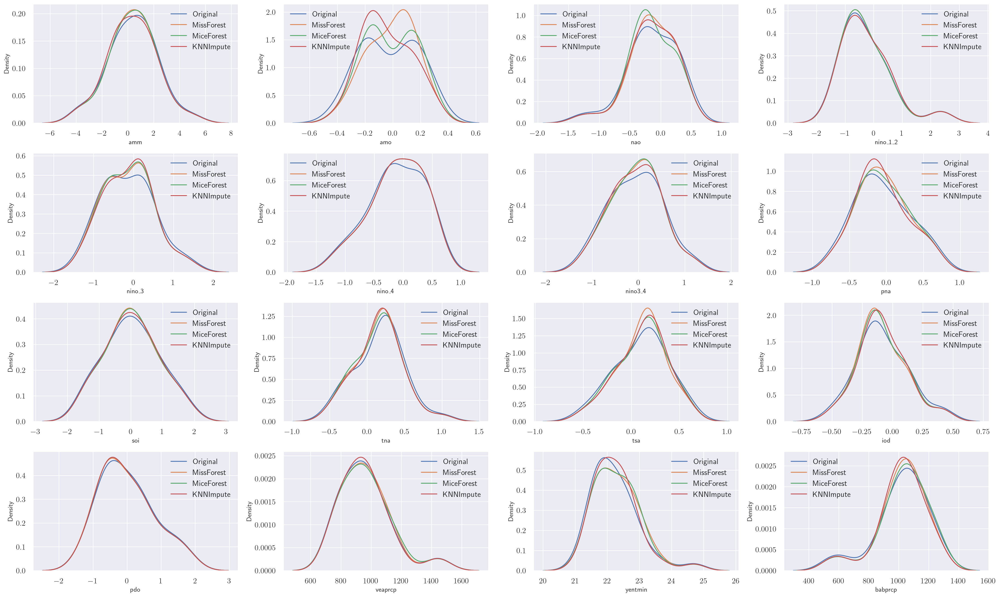

In [45]:
import math
sns.set(style='darkgrid')
# list the columns with NaN values in the DataFrame
columns_with_nans = df.columns[df.isnull().any()].tolist()
print("Columns with NaNs:", columns_with_nans)

# fig, ax = plt.subplots(figsize=(29, 12), nrows=2, ncols=4, dpi=150)

# for col, i, j in zip(columns_with_nans, [0, 0, 0, 0, 1, 1, 1, 1], [0, 1, 2, 3, 0, 1, 2, 3]):
# Determine the number of rows and columns needed
cols = 4
num_columns = len(columns_with_nans[:-1])
num_rows = math.ceil(num_columns / cols)  # Assuming you want 8 columns per row

fig, ax = plt.subplots(figsize=(25, 15), nrows=num_rows, ncols=cols, dpi=180)

for idx, col in enumerate(columns_with_nans[:-1]):
    i = idx // cols  # Calculate the row index
    j = idx % cols   # Calculate the column index
    sns.kdeplot(x=df[col][df.iloc[:, :].isnull().any(axis=1)], label='Original', ax=ax[i][j])
    sns.kdeplot(x=miss_df[col][df.iloc[:, :].isnull().any(axis=1)], label='MissForest', ax=ax[i][j])
    sns.kdeplot(x=mice_df[col][df.iloc[:, :].isnull().any(axis=1)], label='MiceForest', ax=ax[i][j])
    sns.kdeplot(x=knn_df[col][df.iloc[:, :].isnull().any(axis=1)], label='KNNImpute', ax=ax[i][j])

    # Increase size of ticks, labels, and legends
    ax[i][j].tick_params(axis='both', which='major', labelsize=14)
    ax[i][j].legend(fontsize=14)

fig.tight_layout()


In [46]:
mice_df.head()

,amm,amo,nao,nino_1_2,nino_3,nino_4,nino3_4,pna,soi,tna,...,boletmin,babprcp,babtmax,babtmin,navprcp,navtmax,navtmin,damprcp,damtmax,damtmin
0,1.1,0.2,-0.6,-0.8,-0.6,-0.6,-0.4,0.4,0.8,0.1,...,20.4,1145.6,34.1,21.3,1039.8,34.5,22.5,1195.0,33.5,21.3
1,0.7,0.1,-0.2,-0.8,-0.7,-0.6,-0.5,-0.1,0.3,0.2,...,18.9,872.4,33.1,19.0,817.8,34.3,22.0,759.0,32.7,20.8
2,2.0,-0.1,-0.4,-1.2,-0.8,-0.7,-0.7,-0.4,0.9,0.2,...,20.3,1095.7,33.8,21.2,890.7,34.1,22.4,1211.0,33.4,21.5
3,-0.5,-0.1,-0.6,-0.5,0.1,-0.3,0.2,-0.1,-0.1,0.2,...,20.4,1193.7,33.9,20.7,1244.1,34.3,22.1,1527.0,33.7,21.0
4,0.4,-0.1,-0.2,-1.5,-1.1,-1.0,-0.8,-0.3,1.0,0.1,...,20.3,1170.6,34.1,20.9,923.2,34.3,22.2,979.0,33.1,21.7


In [47]:
miss_df.head()

,amm,amo,nao,nino_1_2,nino_3,nino_4,nino3_4,pna,soi,tna,...,boletmin,babprcp,babtmax,babtmin,navprcp,navtmax,navtmin,damprcp,damtmax,damtmin
0,1.1,0.2,-0.6,-0.8,-0.6,-0.6,-0.4,0.4,0.8,0.1,...,20.4,1145.6,34.1,21.3,1039.8,34.5,22.5,1195.0,33.5,21.3
1,0.7,0.1,0.0,-0.8,-0.7,-0.6,-0.5,-0.1,0.3,0.2,...,18.9,872.4,33.1,19.0,817.8,34.3,22.0,759.0,32.7,20.8
2,2.0,0.0,-0.4,-1.2,-0.8,-0.7,-0.7,-0.4,0.9,0.2,...,20.3,1095.7,33.8,21.2,890.7,34.1,22.4,1211.0,33.4,21.5
3,-0.5,-0.0,-0.6,-0.5,0.1,-0.3,0.2,-0.1,-0.1,0.2,...,20.4,1193.7,33.9,20.7,1244.1,34.3,22.1,1527.0,33.7,21.0
4,0.4,-0.1,-0.2,-1.5,-1.1,-1.0,-0.8,-0.3,1.0,0.1,...,20.3,1027.3,34.1,20.9,923.2,34.3,22.2,979.0,33.1,21.7


In [48]:
knn_df.head()

,amm,amo,nao,nino_1_2,nino_3,nino_4,nino3_4,pna,soi,tna,...,boletmin,babprcp,babtmax,babtmin,navprcp,navtmax,navtmin,damprcp,damtmax,damtmin
0,1.1,0.2,-0.6,-0.8,-0.6,-0.6,-0.4,0.4,0.8,0.1,...,20.4,1145.6,34.1,21.3,1039.8,34.5,22.5,1195.0,33.5,21.3
1,0.7,0.1,0.0,-0.8,-0.7,-0.6,-0.5,-0.1,0.3,0.1,...,18.9,872.4,33.1,19.0,817.8,34.3,22.0,759.0,32.7,20.8
2,2.0,-0.2,-0.4,-1.2,-0.8,-0.7,-0.7,-0.4,0.9,0.2,...,20.3,1095.7,33.8,21.2,890.7,34.1,22.4,1211.0,33.4,21.5
3,-0.5,-0.1,-0.6,-0.5,0.1,-0.3,0.2,-0.1,-0.1,0.2,...,20.4,1193.7,33.9,20.7,1244.1,34.3,22.1,1527.0,33.7,21.0
4,0.4,-0.1,-0.2,-1.5,-1.1,-1.0,-0.8,-0.3,1.0,0.1,...,20.3,964.9,34.1,20.9,923.2,34.3,22.2,979.0,33.1,21.7


In [49]:
elementwise_avg.head()

,amm,amo,nao,nino_1_2,nino_3,nino_4,nino3_4,pna,soi,tna,...,boletmin,babprcp,babtmax,babtmin,navprcp,navtmax,navtmin,damprcp,damtmax,damtmin
0,1.1,0.200000,-0.600000,-0.8,-0.6,-0.6,-0.4,0.4,0.8,0.100000,...,20.4,1145.600000,34.1,21.3,1039.8,34.5,22.5,1195.0,33.5,21.3
1,0.7,0.100000,-0.066667,-0.8,-0.7,-0.6,-0.5,-0.1,0.3,0.166667,...,18.9,872.400000,33.1,19.0,817.8,34.3,22.0,759.0,32.7,20.8
2,2.0,-0.100000,-0.400000,-1.2,-0.8,-0.7,-0.7,-0.4,0.9,0.200000,...,20.3,1095.700000,33.8,21.2,890.7,34.1,22.4,1211.0,33.4,21.5
3,-0.5,-0.066667,-0.600000,-0.5,0.1,-0.3,0.2,-0.1,-0.1,0.200000,...,20.4,1193.700000,33.9,20.7,1244.1,34.3,22.1,1527.0,33.7,21.0
4,0.4,-0.100000,-0.200000,-1.5,-1.1,-1.0,-0.8,-0.3,1.0,0.100000,...,20.3,1054.266667,34.1,20.9,923.2,34.3,22.2,979.0,33.1,21.7


* selecting mice imputation

In [50]:
df_ = mice_df.copy()

* Descriptive statistics

In [51]:
df_.describe().T

,count,mean,std,min,25%,50%,75%,max
amm,57.0,0.019298,1.971261,-4.1,-1.2,0.3,1.2,5.0
amo,57.0,-0.040351,0.195356,-0.4,-0.2,-0.1,0.1,0.3
nao,57.0,-0.089474,0.395819,-1.3,-0.3,-0.2,0.2,0.7
nino_1_2,57.0,-0.224561,0.886663,-1.5,-0.9,-0.5,0.4,2.4
nino_3,57.0,-0.178947,0.674467,-1.3,-0.7,-0.3,0.3,1.5
nino_4,57.0,-0.229825,0.550313,-1.5,-0.7,-0.2,0.2,1.0
nino3_4,57.0,-0.147368,0.640342,-1.3,-0.6,-0.1,0.3,1.5
pna,57.0,-0.087719,0.365020,-0.8,-0.3,-0.1,0.2,0.7
soi,57.0,0.180702,0.997396,-1.5,-0.4,0.2,0.8,2.3
tna,57.0,0.096491,0.322360,-0.6,-0.2,0.2,0.3,1.0


* Checking for any anomalies 

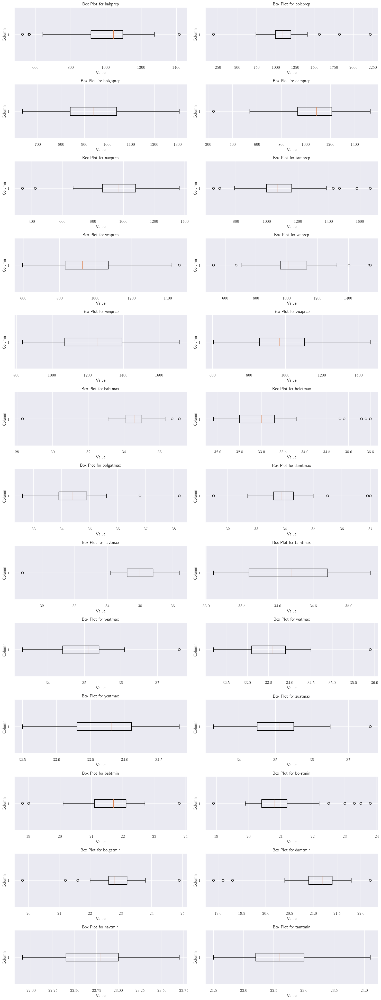

In [52]:
# Select a subset of numeric columns for visualization (e.g., first 10 columns)
# numeric_columns_subset = data.iloc[:, data.columns != 'Bankrupt?'].select_dtypes(include=['number']).iloc[:, :26]
col = [
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]
numeric_columns_subset = df_[col].iloc[:, :26]
# Determine the number of rows and columns for subplots
num_cols = numeric_columns_subset.shape[1]
num_rows = (num_cols + 1) // 2  # Adjust the layout according to your preference

# Create subplots for each numeric column
fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 3))

for i, column in enumerate(numeric_columns_subset.columns):
    row_index = i // 2
    col_index = i % 2
    ax = axes[row_index, col_index]
    ax.boxplot(df_[column], vert=False)
    ax.set_title(f'Box Plot for {column}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Column')

# Adjust layout
plt.tight_layout()
plt.show()

* Checking normality  as well

In [53]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, probplot

class NormalityChecker:
    def __init__(self, df):
        self.df = df

    def _plot_distribution(self, ax, data, title, log_transform=False):        
        if log_transform:
            data = np.log1p(data)
            data = data.replace(-np.inf, np.nan).dropna()  # Filter out -inf values

        sns.histplot(data,
                     kde=True,
                     stat='density',
                     line_kws={'linewidth': 2, 'color': 'darkgreen'},
                     ax=ax,
                     label='Histogram')
        sns.kdeplot(data, color='blue', ax=ax, linestyle='--', label='KDE Fit')
        xmin, xmax = ax.get_xlim()
        x_values = np.linspace(xmin, xmax, 100)
        p_values = norm.pdf(x_values, np.mean(data), np.std(data))
        ax.plot(x_values, p_values, 'k-', linewidth=2, label='Normal Fit')
        ax.grid(True, linestyle='--')
        ax.legend()

        (mu, sigma) = norm.fit(data)
        ax.text(0.05, 0.95, f'$\mu={mu:.2f}$\n$\sigma={sigma:.2f}$',
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top')
        ax.set_title(title)

    def _qq_plot(self, ax, data):        
        probplot(data, plot=ax, rvalue=True)
        ax.grid(True, linestyle='--')

    def check_normality(self, cname, dir='.'):
        fig, (ax1, ax2) = plt.subplots(1, 2,
                                        figsize=(12, 6),
                                        dpi=80)

        self._plot_distribution(ax1, self.df[cname], f'{cname} distribution')
        self._qq_plot(ax2, self.df[cname])        

        fig.tight_layout()
        # Save the figure in both PDF and PNG formats
        for ext in ['pdf', 'png']:
            plt.savefig(dir + '/' + f'{cname}.{ext}', 
                        bbox_inches='tight',  # Trim the white spaces around the figure
                        pad_inches=0.1,       # Padding between the figure and the edges
                        format=ext,          # Save as the current extension
                        dpi=300 if ext == 'png' else None,  # Set DPI only for PNG format
                        transparent=True
                       )
        plt.show()


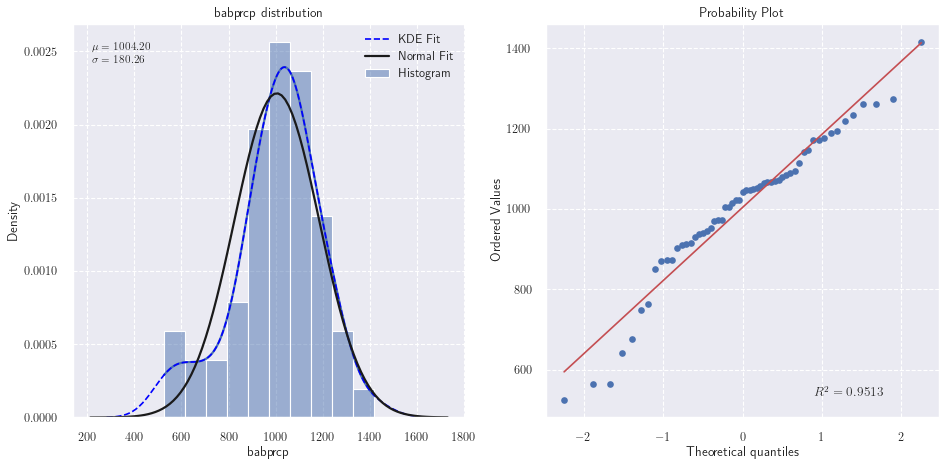

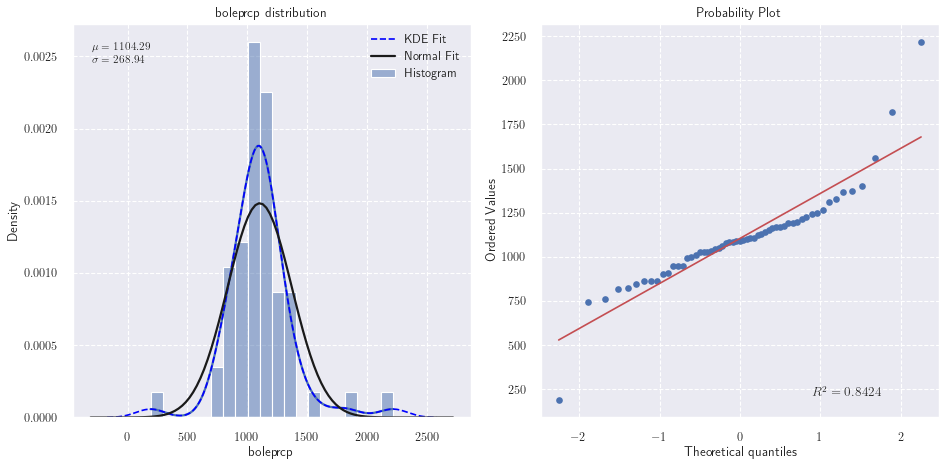

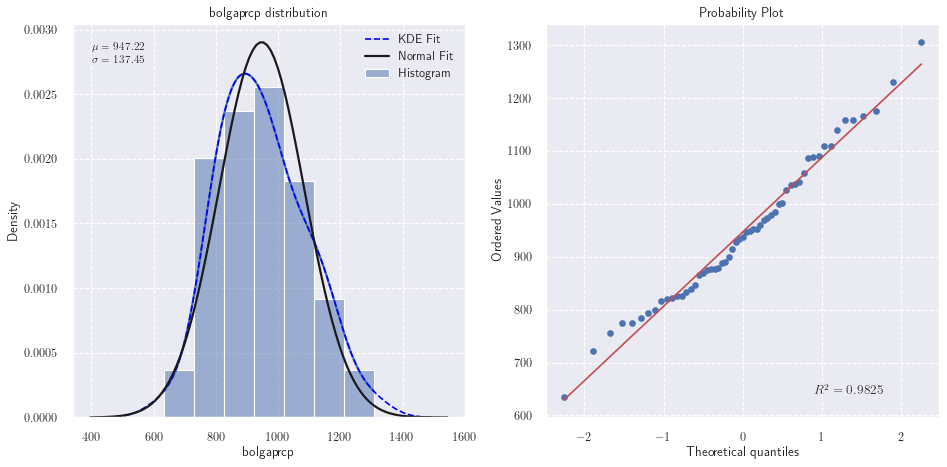

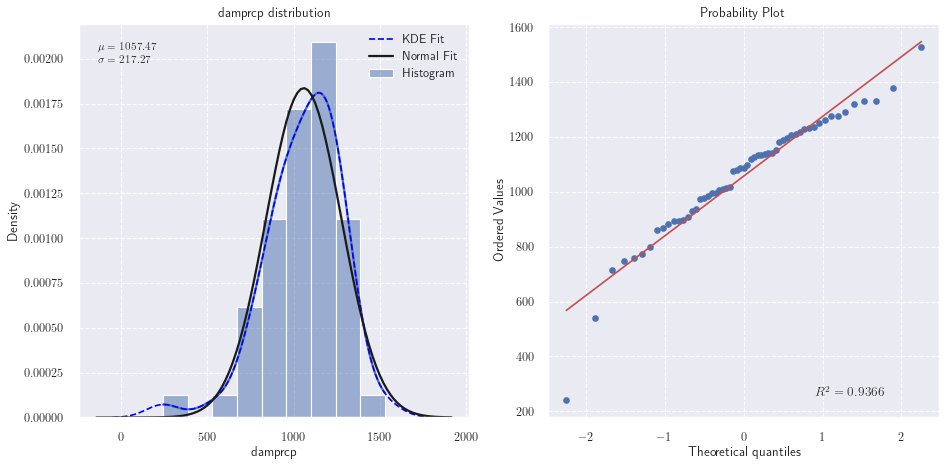

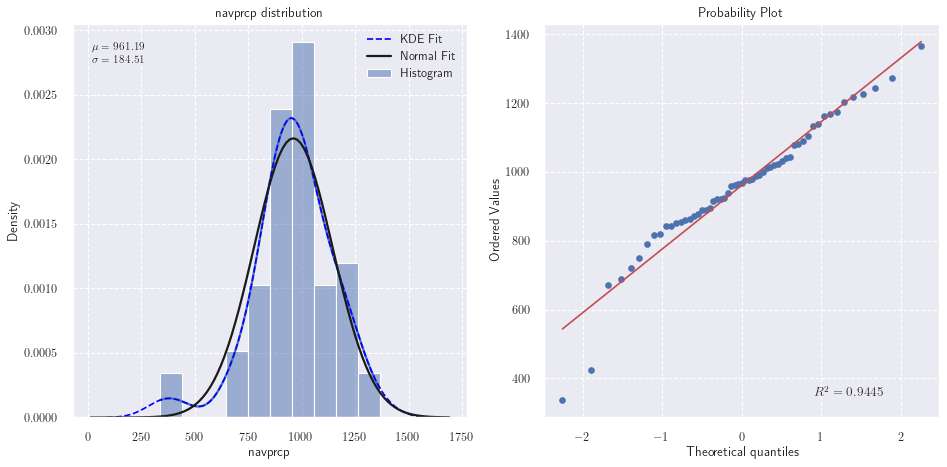

...

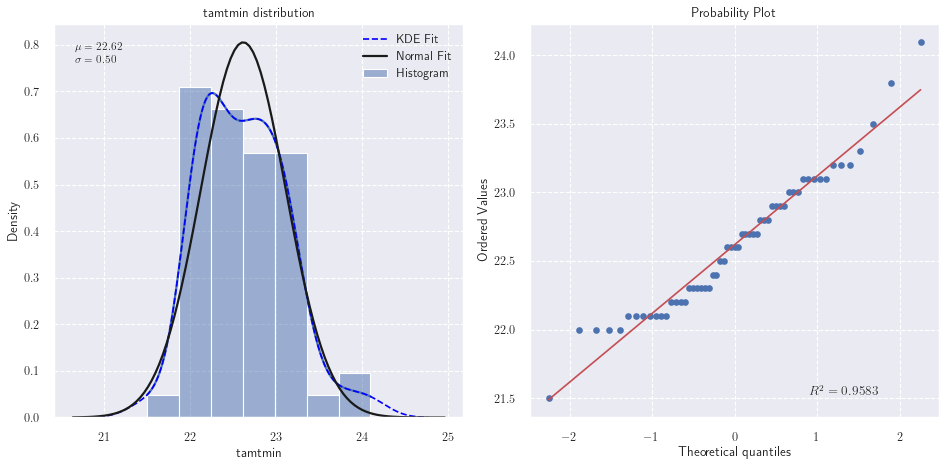

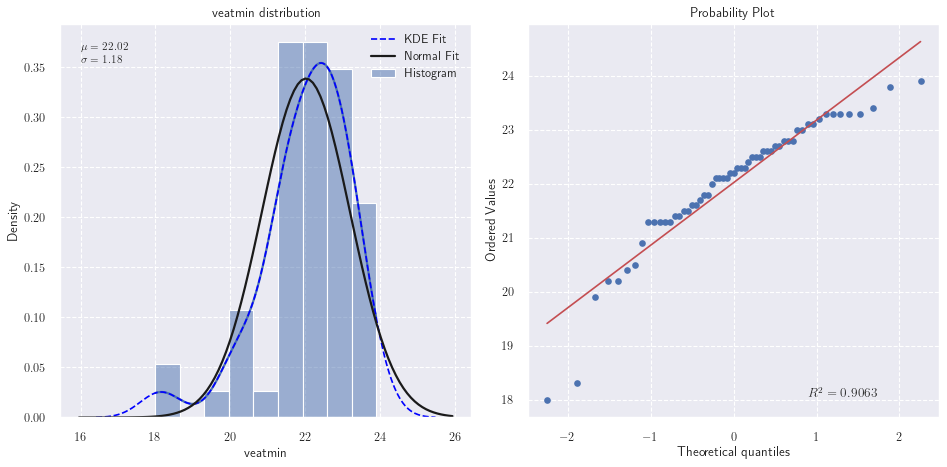

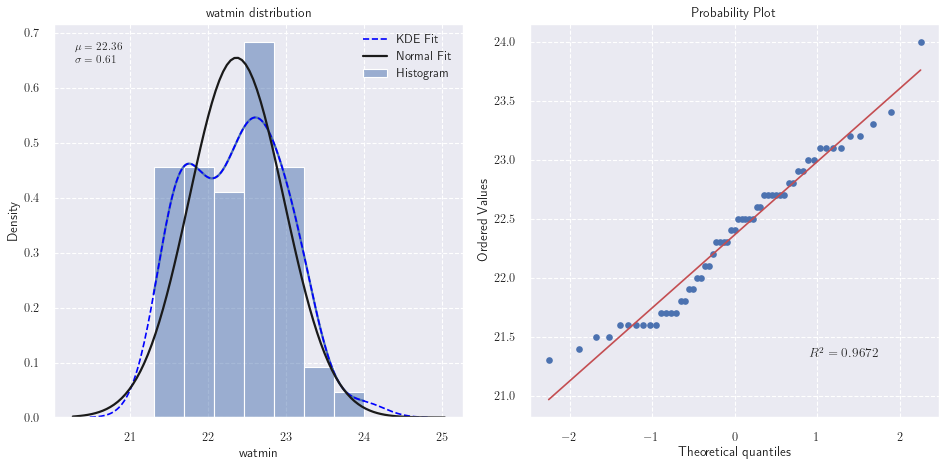

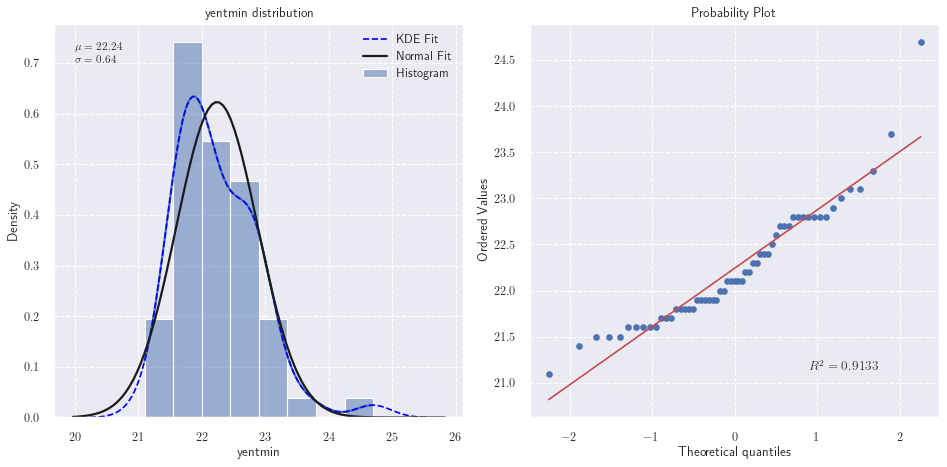

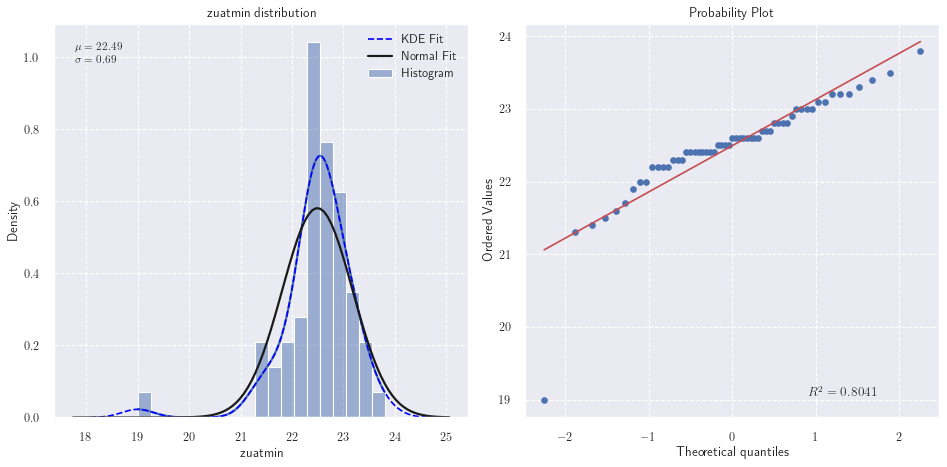

In [54]:
normality_checker = NormalityChecker(df_)

for c in [
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]:
    normality_checker.check_normality(f'{c}', dir=output_dir)

### Fixing anomalies using Bayesian change point analysis and Hampel identifier

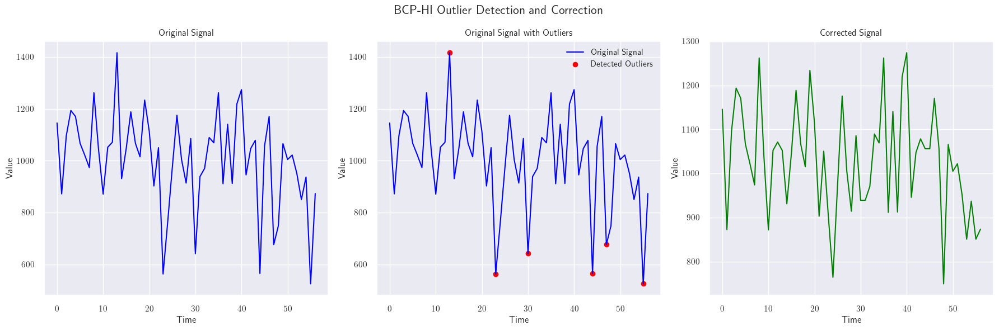

In [55]:
import numpy as np
from scipy.stats import norm
from scipy.signal import medfilt
import matplotlib.pyplot as plt

class HybridOutlierDetection:
    def __init__(self, window_size, mad_multiplier=3.0):
        self.window_size = window_size
        self.mad_multiplier = mad_multiplier
    
    def bcp_analysis(self, time_series, prior='uniform'):
        # Perform Change Point Analysis with pseudo-posterior calculation
        # Assume normal distribution for each segment
        cps = []  # Change points
        start_idx = 0
        while start_idx < len(time_series):
            segment = time_series[start_idx:]
            if len(segment) < 3:  # Too few points for BCP
                break
            mean = np.mean(segment)
            std = np.std(segment)
            p_values = []
            for i in range(1, len(segment)):
                seg1 = segment[:i]
                seg2 = segment[i:]
                # Likelihood of each segment assuming normal distribution
                likelihood_seg1 = norm.logpdf(seg1, mean, std).sum()
                likelihood_seg2 = norm.logpdf(seg2, mean, std).sum()
                # Combined log-likelihood
                p = likelihood_seg1 + likelihood_seg2
                
                # Prior (uniform in this case)
                if prior == 'uniform':
                    prior_i = np.log(1 / (len(segment) - 1))  # Uniform prior over all possible split points
                else:
                    raise NotImplementedError("Only uniform prior supported currently")
                
                # Pseudo-posterior (likelihood * prior, not a true posterior)
                p_values.append(p + prior_i)
            max_idx = np.argmax(p_values)
            if p_values[max_idx] > np.log(1 / len(segment)):  # Adjusted threshold
                cps.append(start_idx + max_idx)
                start_idx += max_idx + 1
            else:
                break
        return cps  
    
    def iqr_outliers(self, time_series):
        # Detect outliers using Interquartile Range (IQR)
        q1, q3 = np.percentile(time_series, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - self.mad_multiplier * self.mad(time_series)  # Adjusted lower bound
        upper_bound = q3 + self.mad_multiplier * self.mad(time_series)  # Adjusted upper bound
        outliers = np.where((time_series < lower_bound) | (time_series > upper_bound))[0]
        return outliers.tolist()

    def mad(self, time_series):
        # Compute the Median Absolute Deviation (MAD)
        return np.median(np.abs(time_series - np.median(time_series)))
    
    def hampel_identifier(self, time_series, cps):
        # Apply Hampel Identifier to detect outliers in segments
        outliers = []
        for i in range(len(cps) - 1):
            start_idx = cps[i]
            end_idx = cps[i + 1] if i + 1 < len(cps) else len(time_series)
            segment = time_series[start_idx:end_idx]
            median = np.median(segment)
            mad = np.median(np.abs(segment - median))
            threshold = self.mad_multiplier * mad
            for j in range(len(segment)):
                if np.abs(segment[j] - median) > threshold:
                    outliers.append(start_idx + j)
        return outliers
        
    def detect_outliers(self, time_series):
        # Combine IQR and Hampel for robust outlier detection
        iqr_outliers = self.iqr_outliers(time_series)
        cps = self.bcp_analysis(time_series)
        hampel_outliers = self.hampel_identifier(time_series, cps)
        all_outliers = list(set(iqr_outliers + hampel_outliers))  # Remove duplicates
        return all_outliers
    
    def correct_outliers(self, time_series, outliers):
        # Correct outliers using median filter with odd kernel size
        corrected_signal = time_series.copy()
        for idx in outliers:
            window_size = self.window_size  # Use window_size directly (assuming it's odd)
            start_idx = max(0, idx - window_size // 2)  # Adjust start index for odd window
            end_idx = min(len(time_series), idx + window_size // 2 + 1)
            corrected_signal[idx] = medfilt(time_series[start_idx:end_idx], kernel_size=window_size)[window_size // 2]
        return corrected_signal


# Now run script!!!!
if __name__ == "__main__":

    time_series =  df_['babprcp'].values
    # time_series =  df_['yentmax'].values
    
    outlier_detector = HybridOutlierDetection(window_size=5, mad_multiplier=2.0)
    outliers = outlier_detector.detect_outliers(time_series)
    corrected_signal = outlier_detector.correct_outliers(time_series, outliers)
    
    # Plot results in three subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    
    # Plot original signal
    axs[0].plot(time_series, color='blue')
    axs[0].set_title('Original Signal')
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('Value')
    axs[0].grid(True)
    
    # Plot original signal with detected outliers
    axs[1].plot(time_series, color='blue', label='Original Signal')
    axs[1].scatter(outliers, time_series[outliers], color='red', label='Detected Outliers')
    axs[1].set_title('Original Signal with Outliers')
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('Value')
    axs[1].legend()
    axs[1].grid(True)
    
    # Plot corrected signal
    axs[2].plot(corrected_signal, color='green')
    axs[2].set_title('Corrected Signal')
    axs[2].set_xlabel('Time')
    axs[2].set_ylabel('Value')
    axs[2].grid(True)
    
    plt.suptitle('BCP-HI Outlier Detection and Correction', fontsize=16)
    plt.tight_layout()
    plt.show()


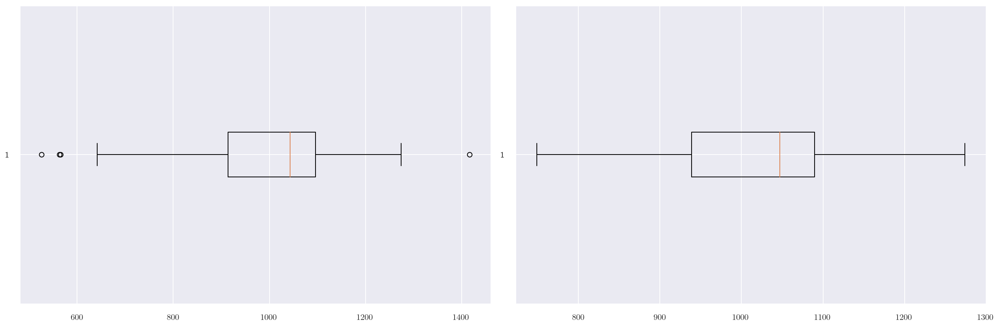

In [56]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6), dpi=150)
axs[0].boxplot(time_series, vert=False)
axs[1].boxplot(corrected_signal, vert=False)
# Adjust layout
plt.tight_layout()
plt.show()

#### Run for all the climate variables

In [57]:
outlier_detector = HybridOutlierDetection(window_size=5, mad_multiplier=2.0)

df_cln = pd.DataFrame()

for c in [
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]:

    outliers = outlier_detector.detect_outliers(df_[f'{c}'].values)
    df_cln[f'{c}'] = outlier_detector.correct_outliers(df_[f'{c}'].values, outliers)
    
df_cln.head()

,babprcp,boleprcp,bolgaprcp,damprcp,navprcp,tamprcp,veaprcp,waprcp,yenprcp,zuaprcp,...,babtmin,boletmin,bolgatmin,damtmin,navtmin,tamtmin,veatmin,watmin,yentmin,zuatmin
0,1145.6,192.0,1110.4,1195.0,1039.8,1281.4,1122.2,1117.0,1196.7,1221.0,...,21.3,20.4,22.7,21.3,22.5,22.5,22.2,21.9,22.0,22.3
1,872.4,1311.2,784.0,759.0,817.8,831.4,914.3,818.0,1100.5,839.0,...,20.7,20.3,22.6,20.8,22.0,22.1,21.4,21.3,21.6,22.0
2,1095.7,1311.2,1025.7,1211.0,890.7,1151.9,1122.2,1117.0,1471.0,1043.0,...,21.2,20.3,22.5,21.5,22.4,22.3,21.4,21.4,21.6,22.2
3,1193.7,1371.0,1139.0,1211.0,1244.1,1151.9,1196.7,1195.0,1582.3,1043.0,...,20.7,20.4,22.5,21.0,22.1,22.2,21.3,21.7,21.7,22.0
4,1170.6,1128.2,915.0,979.0,923.2,1054.3,951.6,1033.0,922.8,965.0,...,20.9,20.3,22.5,21.7,22.2,22.3,21.5,21.7,21.7,22.0


In [58]:
gk = df_[['amm', 'nino3_4', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4','pna','soi', 'tna','iod', 'pdo', 'tsa']]

* **Variance Inflation Factor (VIF):**

In [59]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Function to calculate VIF
def calculate_vif(data):
    # Add a constant column to the data
    data_with_const = add_constant(data)
    # Calculate VIF for each variable
    vif_data = pd.Series([variance_inflation_factor(data_with_const.values, i) 
                          for i in range(data_with_const.shape[1])], 
                         index=data_with_const.columns)
    return vif_data

# Calculate VIF for the dataframe
vif_results = calculate_vif(gk)

# Display the VIF results
print("Variance Inflation Factor (VIF):")
print(vif_results)


Variance Inflation Factor (VIF):
const        5.571963
amm         27.962340
nino3_4     55.068537
amo          5.266064
nao          1.934068
nino_1_2     9.622147
nino_3      38.805055
nino_4      16.078519
pna          2.525199
soi          8.467285
tna         37.202392
iod          1.921854
pdo          3.422982
tsa          5.343977
dtype: float64


This statistic measures how much the variance of an estimated coefficient is inflated due to collinearity. A VIF value greater than 10 suggests potential collinearity issues.

In [60]:
# gk = df[['amo', 'nao', 'pna','soi', 'iod', 'pdo', 'tsa', 'tna', 'nino3_4']]
# gk = df[['amo', 'nao', 'nino_1_2',  'nino_4','pna','soi', 'tna','iod', 'pdo', 'tsa']]
gk = df_[['amo', 'nao', 'nino_1_2',  'nino_4','pna','soi', 'iod', 'pdo', 'tsa']]
# Calculate VIF for the dataframe
vif_results = calculate_vif(gk)

# Display the VIF results
print("Variance Inflation Factor (VIF):")
print(vif_results)


Variance Inflation Factor (VIF):
const       2.405235
amo         2.087513
nao         1.387810
nino_1_2    2.474817
nino_4      5.627226
pna         2.229480
soi         6.551353
iod         1.870461
pdo         3.366341
tsa         1.479141
dtype: float64


* Correlation matrix

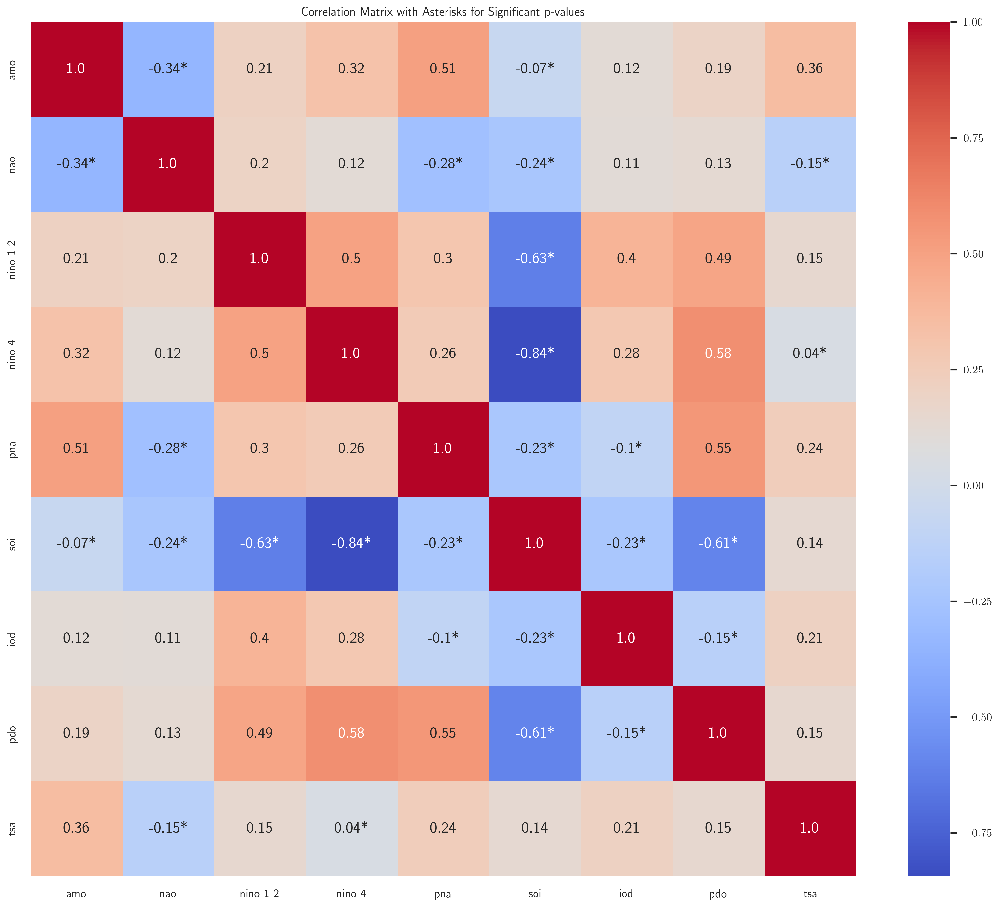

In [61]:

corr_matrix = gk.corr()

# Calculate p-values for correlation
p_values = gk.apply(lambda x: gk.corrwith(x).apply(lambda y: '*' if y < 0.05 else ''))


# Plot heatmap with asterisks for significant p-values
plt.figure(figsize=(18, 15), dpi=300)
annot_values = corr_matrix.round(2).astype(str) + p_values
sns.heatmap(corr_matrix, annot=annot_values, cmap='coolwarm', fmt="", annot_kws={"size": 15})
plt.title('Correlation Matrix with Asterisks for Significant p-values')
# # Save the figure with additional options
# plt.savefig('{c}_feature_importance.png', 
#             bbox_inches='tight',  # Trim the white spaces around the figure
#             pad_inches=0.1,       # Padding between the figure and the edges
#             format='p',         # Save as PNG format
#             dpi=300               # Set the resolution to 300 dots per inch
#            )
# Save the figure in both PDF and PNG formats
for ext in ['pdf', 'png']:
    plt.savefig(output_dir + '/' + f'_cormatix.{ext}', 
                bbox_inches='tight',  # Trim the white spaces around the figure
                pad_inches=0.1,       # Padding between the figure and the edges
                format=ext,          # Save as the current extension
                dpi=300 if ext == 'png' else None,  # Set DPI only for PNG format
                transparent=True
               )
plt.show()

##### select top features

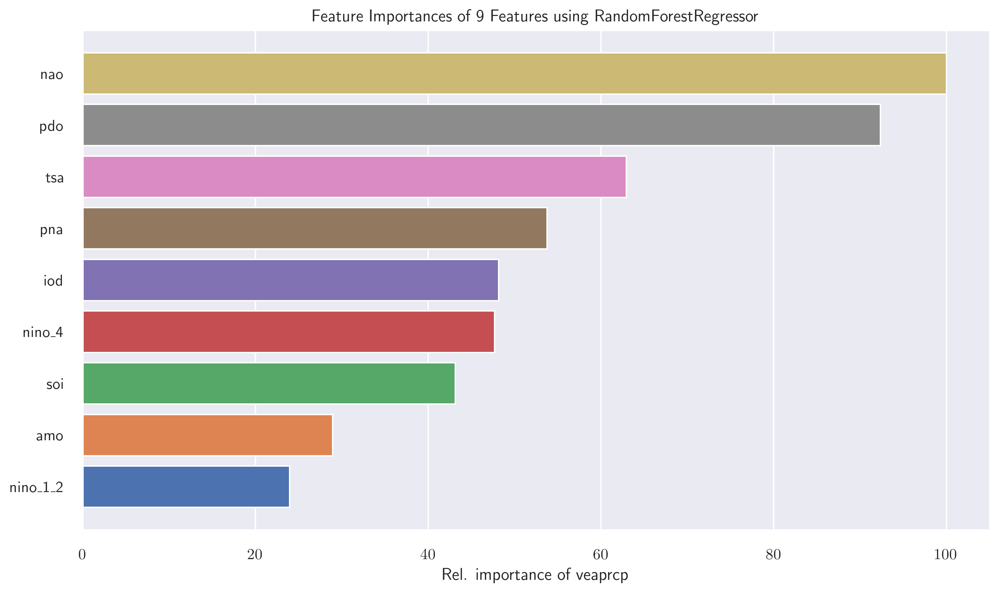

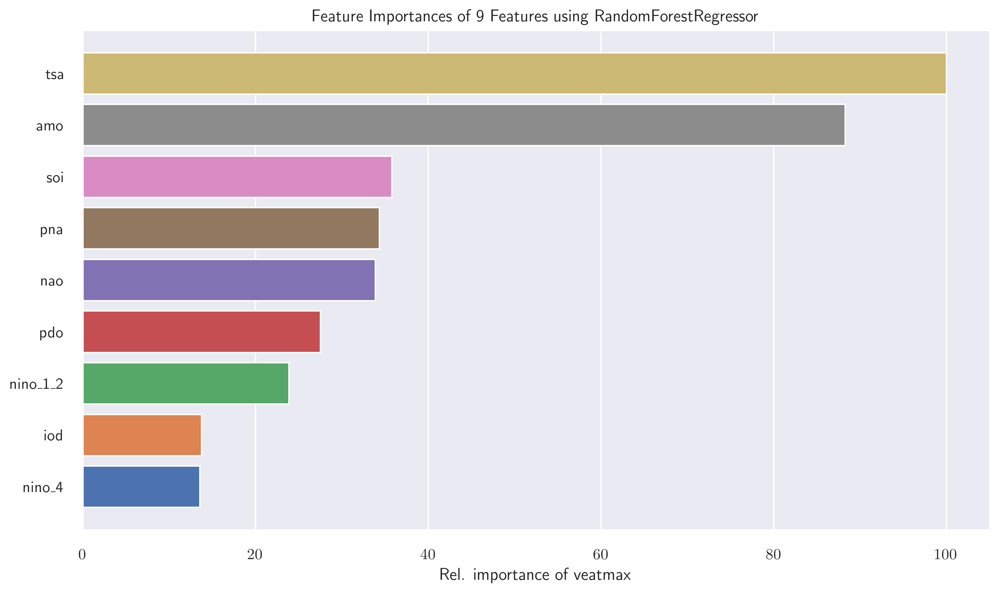

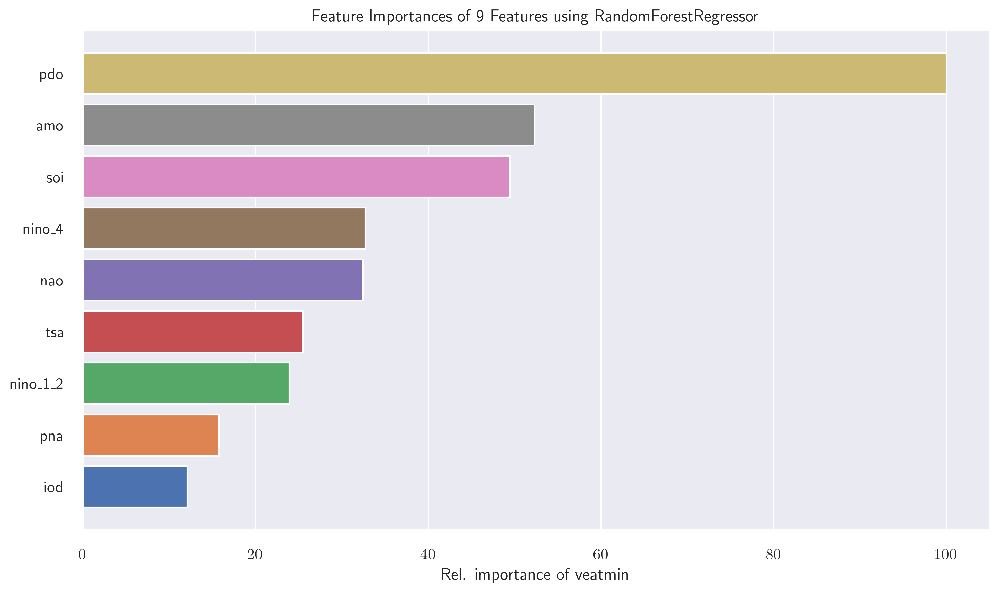

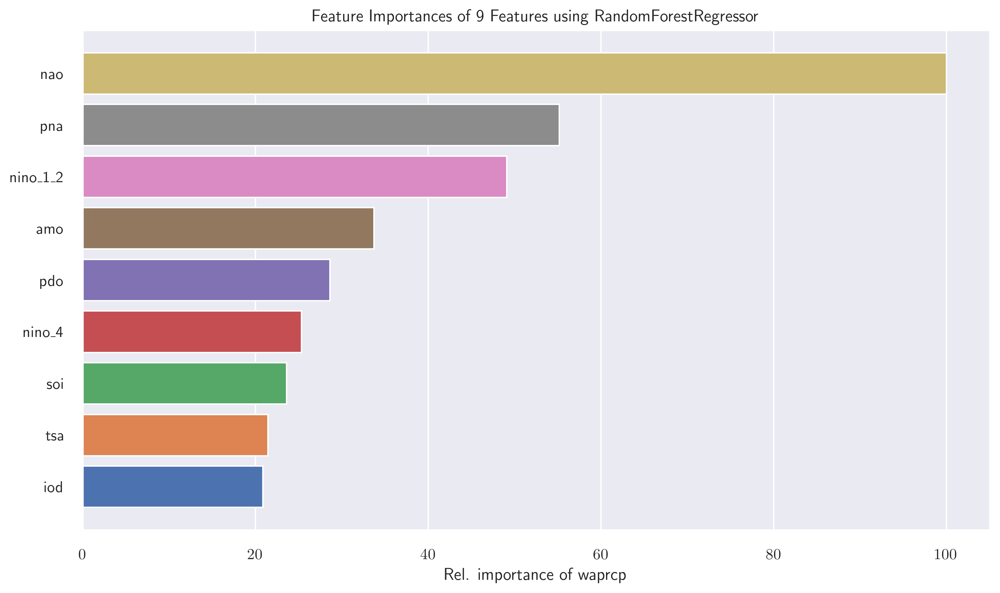

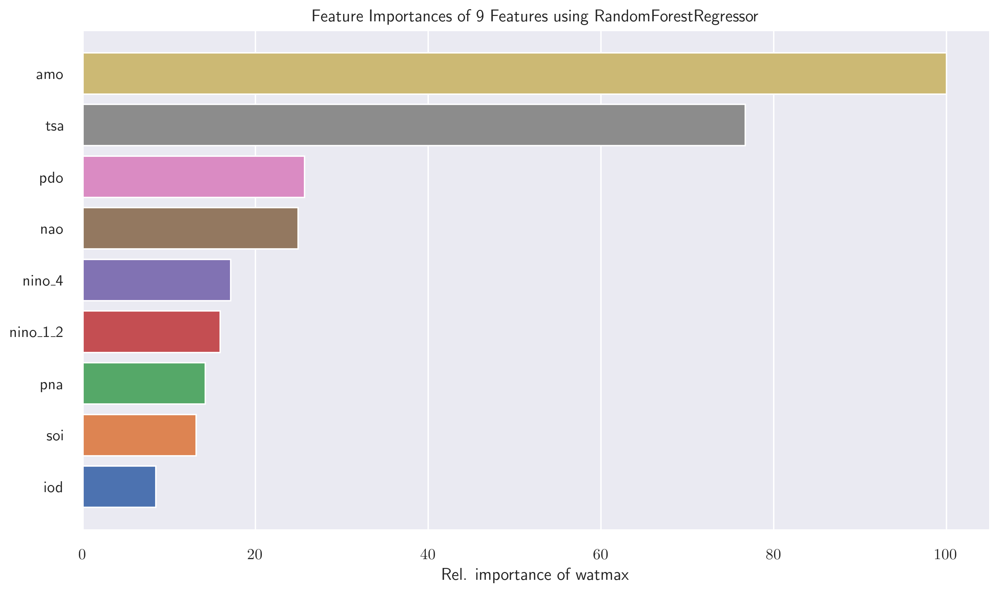

...

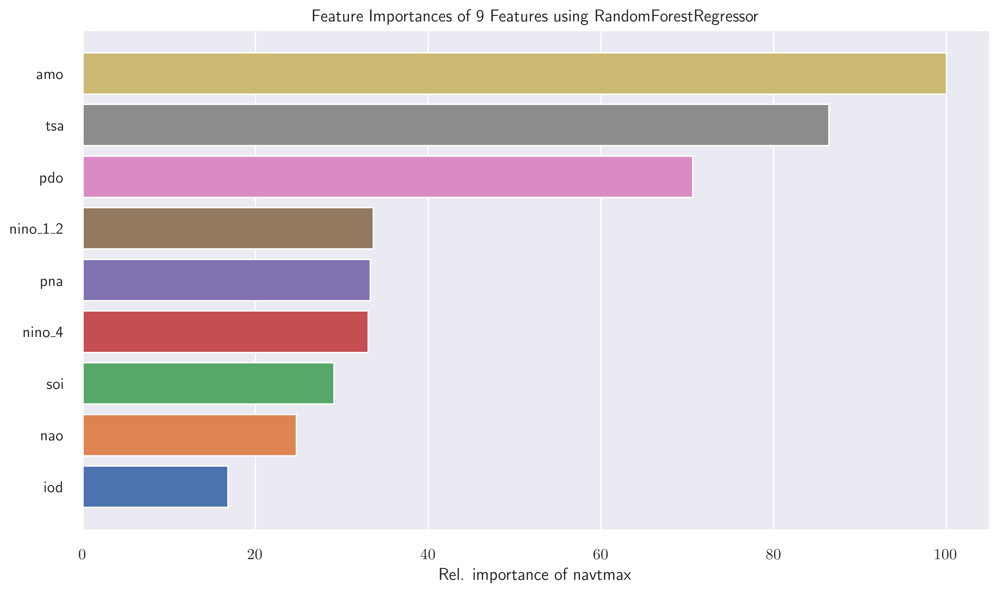

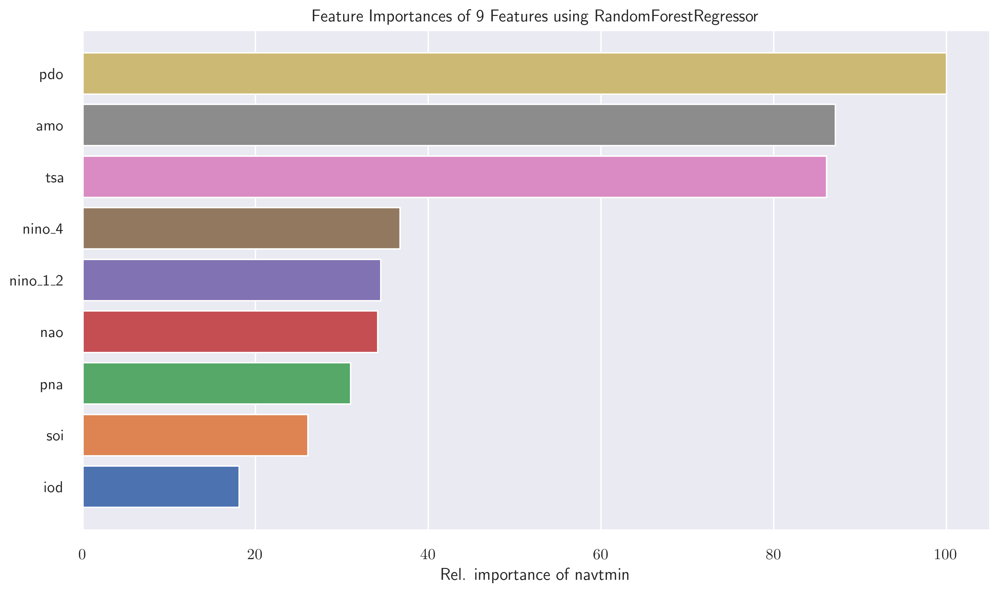

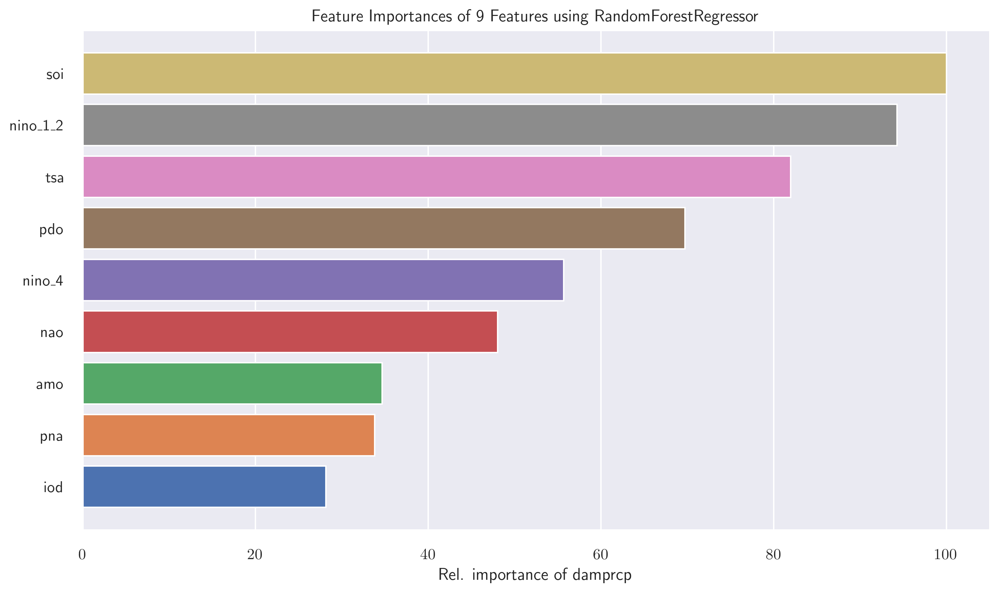

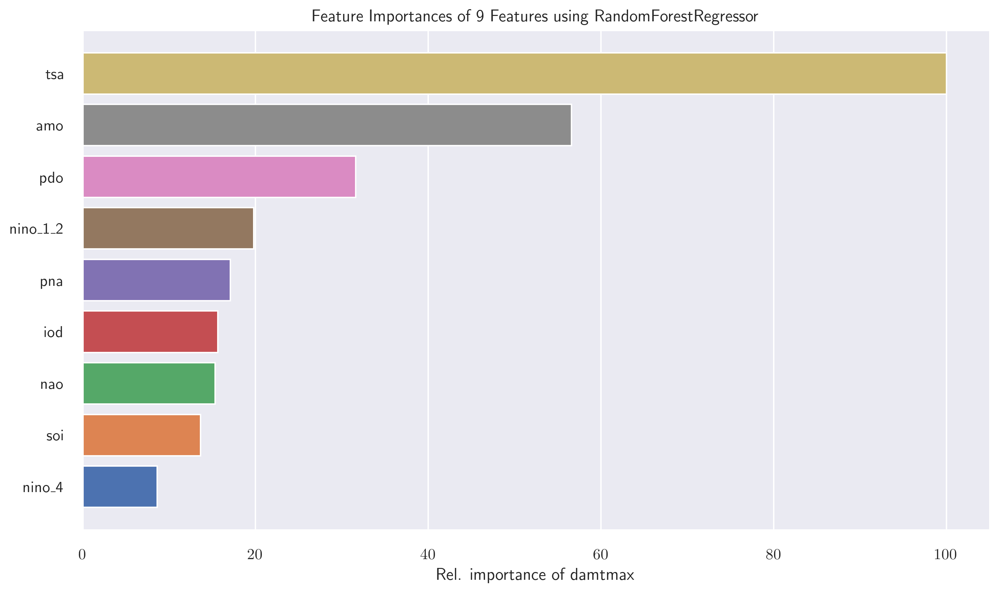

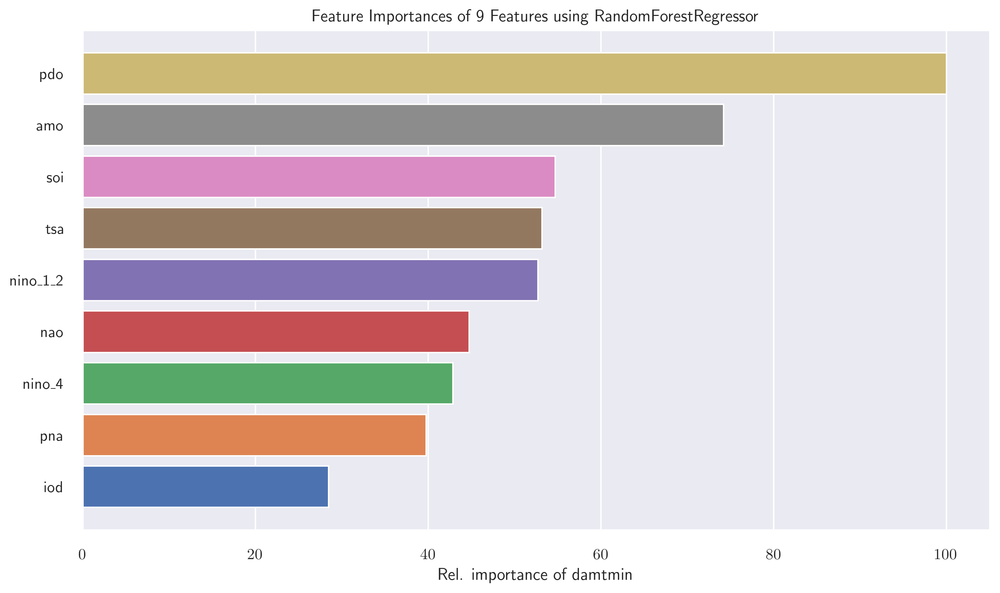

{'veaprcp': ['nao', 'pdo', 'tsa'], 'veatmax': ['tsa', 'amo', 'soi'], 'veatmin': ['pdo', 'amo', 'soi'], 'waprcp': ['nao', 'pna', 'nino_1_2'], 'watmax': ['amo', 'tsa', 'pdo'], 'watmin': ['amo', 'tsa', 'pdo'], 'yenprcp': ['soi', 'pdo', 'nao'], 'yentmax': ['amo', 'tsa', 'nino_1_2'], 'yentmin': ['amo', 'tsa', 'pdo'], 'zuaprcp': ['pdo', 'nao', 'soi'], 'zuatmax': ['nino_1_2', 'amo', 'soi'], 'zuatmin': ['tsa', 'amo', 'nao'], 'tamprcp': ['pdo', 'nino_1_2', 'nao'], 'tamtmax': ['tsa', 'amo', 'pdo'], 'tamtmin': ['amo', 'tsa', 'pdo'], 'bolgaprcp': ['nao', 'pdo', 'tsa'], 'bolgatmax': ['amo', 'soi', 'pdo'], 'bolgatmin': ['amo', 'tsa', 'pdo'], 'boleprcp': ['iod', 'tsa', 'nino_1_2'], 'boletmax': ['amo', 'pdo', 'pna'], 'boletmin': ['amo', 'pna', 'pdo'], 'babprcp': ['nino_4', 'nino_1_2', 'tsa'], 'babtmax': ['tsa', 'nao', 'pdo'], 'babtmin': ['pdo', 'nino_1_2', 'tsa'], 'navprcp': ['pdo', 'nino_4', 'pna'], 'navtmax': ['amo', 'tsa', 'pdo'], 'navtmin': ['pdo', 'amo', 'tsa'], 'damprcp': ['soi', 'nino_1_2', 'ts

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor as rfR
from yellowbrick.model_selection import FeatureImportances

# Generate some example data (replace with your dataset)
np.random.seed(42)
X = gk

# Create an empty dictionary to store the top features for each target variable
top_features_dict = {}

for c in ['veaprcp',
       'veatmax', 'veatmin', 'waprcp', 'watmax', 'watmin', 'yenprcp',
       'yentmax', 'yentmin', 'zuaprcp', 'zuatmax', 'zuatmin', 'tamprcp',
       'tamtmax', 'tamtmin', 'bolgaprcp', 'bolgatmax', 'bolgatmin', 'boleprcp',
       'boletmax', 'boletmin', 'babprcp', 'babtmax', 'babtmin', 'navprcp',
       'navtmax', 'navtmin', 'damprcp', 'damtmax', 'damtmin']:
    y = df_cln[c]

    # Create a Random Forest model
    model = rfR(n_estimators=100, random_state=42)

    # Fit the model
    model.fit(X, y)

    # Get feature importances
    feature_importances = model.feature_importances_
    feature_names = gk.columns

    # Sort feature importances and get the indices of top 40% features
    top_features_indices = np.argsort(feature_importances)[::-1][:int(len(feature_importances)*0.4)]

    # Store the top features in the dictionary
    top_features_dict[c] = list(feature_names[top_features_indices])

    # Visualize feature importances
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
    viz = FeatureImportances(model, ax=ax, xlabel='Rel. importance of ' + c)
    viz.fit(X, y)
    # Save the figure in both PDF and PNG formats
    for ext in ['pdf', 'png']:
        plt.savefig(output_dir + '/' + f'{c}_feature_importance.{ext}', 
                    bbox_inches='tight',  # Trim the white spaces around the figure
                    pad_inches=0.1,       # Padding between the figure and the edges
                    format=ext,          # Save as the current extension
                    dpi=300 if ext == 'png' else None,  # Set DPI only for PNG format
                    transparent=True
                   )
    viz.show()
    plt.show()

# Print the dictionary containing the top features for each target variable
print(top_features_dict)


* Using all the 9 indices for the Linear regression model

In [63]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

In [64]:
Xnew = gk.copy()

In [65]:
# Standardize the features
scaler = StandardScaler()
# Xnew = X.drop(columns=['Distance nearest to human settlement', 'Width', 'Perimeter (m)', 'Depth (cm)', 'Length'])

X_standardized = scaler.fit_transform(Xnew)
# Convert standardized features to DataFrame with meaningful column names Standardized_
columns_standardized = [f'{col}' for col in Xnew.columns]
X_standardized_df = pd.DataFrame(X_standardized, columns=columns_standardized)

# Add a constant term to the standardized features matrix
X_standardized_df = sm.add_constant(X_standardized_df)

for c in [
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]:
    ytransformed_column = df_cln[c]
    # Fit the OLS model with standardized features
    model_standardized = sm.OLS(ytransformed_column, X_standardized_df)
    results_standardized = model_standardized.fit()

    # Display the summary of the regression with standardized features
    print(results_standardized.summary(), '\n')
   

                            OLS Regression Results                            
Dep. Variable:                babprcp   R-squared:                       0.112
Model:                            OLS   Adj. R-squared:                 -0.058
Method:                 Least Squares   F-statistic:                    0.6583
Date:                Thu, 02 May 2024   Prob (F-statistic):              0.742
Time:                        21:32:07   Log-Likelihood:                -350.92
No. Observations:                  57   AIC:                             721.8
Df Residuals:                      47   BIC:                             742.3
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1029.9333     16.650     61.858      0.0

* Using the top 4 indices for the Linear regression model

In [66]:
# Standardize the features
scaler = StandardScaler()


for c in [
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]:

    X_standardized = scaler.fit_transform(gk[top_features_dict[f'{c}']])
    # Convert standardized features to DataFrame with meaningful column names Standardized_
    # columns_standardized = [f'{col}' for col in Xnew.columns]
    X_standardized_df = pd.DataFrame(X_standardized, columns=top_features_dict[f'{c}'])
    
    # Add a constant term to the standardized features matrix
    X_standardized_df = sm.add_constant(X_standardized_df)

    ytransformed_column = df_cln[c]
    # Fit the OLS model with standardized features
    model_standardized = sm.OLS(ytransformed_column, X_standardized_df)
    results_standardized = model_standardized.fit()

    # Display the summary of the regression with standardized features
    print(results_standardized.summary(), '\n')
   

                            OLS Regression Results                            
Dep. Variable:                babprcp   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                 -0.021
Method:                 Least Squares   F-statistic:                    0.6101
Date:                Thu, 02 May 2024   Prob (F-statistic):              0.611
Time:                        21:32:07   Log-Likelihood:                -353.33
No. Observations:                  57   AIC:                             714.7
Df Residuals:                      53   BIC:                             722.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1029.9333     16.358     62.962      0.0

* Taylor's Diagram representations of the 9 indices

In [67]:
def co_standard_deviation(x_values, y_values):
    """
    Calculate the co-standard deviation (pooled standard deviation or standard error of the mean difference)
    between two sets of paired data points.

    Parameters:
    - x_values: Array-like, containing the values of the first set of data points.
    - y_values: Array-like, containing the values of the second set of data points.

    Returns:
    - co_std: Co-standard deviation calculated from the input data.
    """

    # Check if the input arrays have the same length
    if len(x_values) != len(y_values):
        raise ValueError("The input arrays must have the same length.")

    # Calculate the means of the two sets of data points
    mean_x = np.mean(x_values)
    mean_y = np.mean(y_values)

    # Calculate the sum of squared differences from the means for each set
    sum_of_squared_differences = np.sum((x_values - mean_x)**2 + (y_values - mean_y)**2)

    # Calculate the co-standard deviation
    co_std = np.sqrt(sum_of_squared_differences / len(x_values))

    return co_std
    

def centered_root_mean_square_difference(x_values, y_values):
    """
    Calculate the Centered Root Mean Square Difference (CRMSD) between two sets of paired data points.

    Parameters:
    - x_values: Array-like, containing the values of the first set of data points.
    - y_values: Array-like, containing the values of the second set of data points.

    Returns:
    - crmsd: CRMSD calculated from the input data.
    """

    # Check if the input arrays have the same length
    if len(x_values) != len(y_values):
        raise ValueError("The input arrays must have the same length.")

    # Calculate the means of the two sets of data points
    mean_x = np.mean(x_values)
    mean_y = np.mean(y_values)

    # Calculate the centered differences between the paired data points
    centered_differences = (x_values - mean_x) - (y_values - mean_y)

    # Calculate the squared differences
    squared_differences = centered_differences**2

    # Calculate the mean of the squared differences
    mean_squared_differences = np.mean(squared_differences)

    # Calculate the CRMSD
    crmsd = np.sqrt(mean_squared_differences)

    return crmsd

def correlation_coefficient(x_values, y_values):
    """
    Calculate the correlation coefficient between two variables.

    Parameters:
    - x_values: Array-like, containing the values of the first variable.
    - y_values: Array-like, containing the values of the second variable.

    Returns:
    - r: Correlation coefficient calculated from the input data.
    """

    # Check if the input arrays have the same length
    if len(x_values) != len(y_values):
        raise ValueError("The input arrays must have the same length.")

    # Calculate the means of the two variables
    mean_x = np.mean(x_values)
    mean_y = np.mean(y_values)

    # Calculate the covariance between the two variables
    covariance = np.sum((x_values - mean_x) * (y_values - mean_y))

    # Calculate the standard deviations of the two variables
    std_x = np.sqrt(np.sum((x_values - mean_x)**2))
    std_y = np.sqrt(np.sum((y_values - mean_y)**2))

    # Calculate the correlation coefficient
    r = covariance / (std_x * std_y)

    return r

# # Example usage:
# x_values = [1, 2, 3, 4, 5]
# y_values = [2, 3, 4, 5, 6]

# correlation = correlation_coefficient(x_values, y_values)
# print("Correlation coefficient:", correlation)


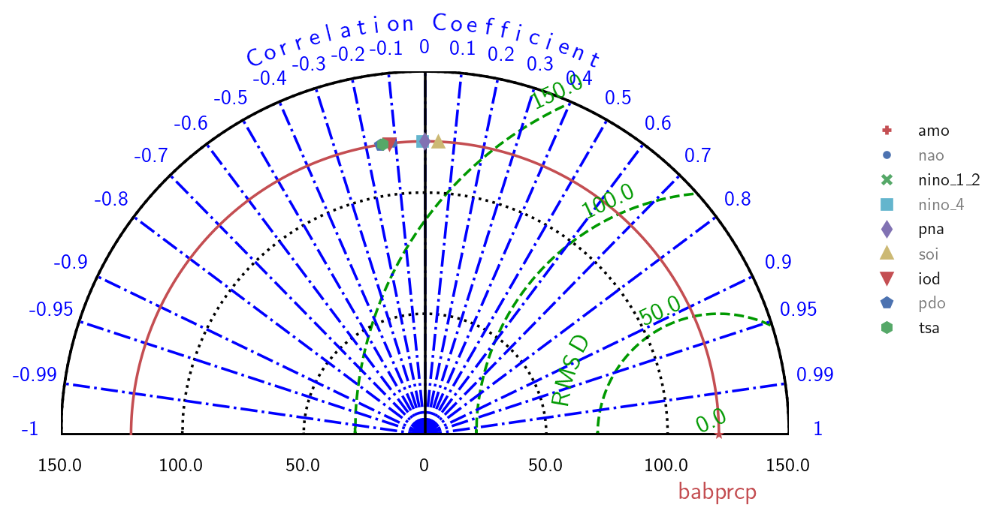

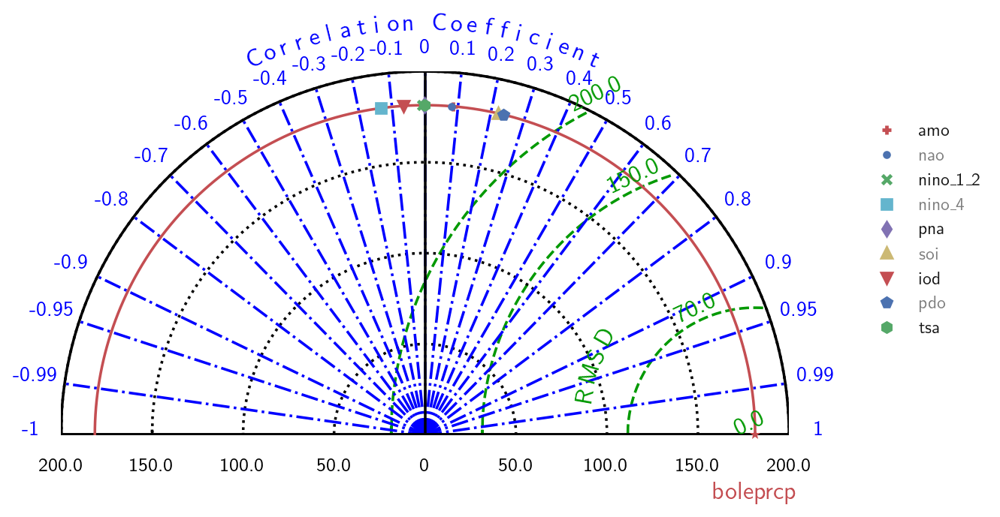

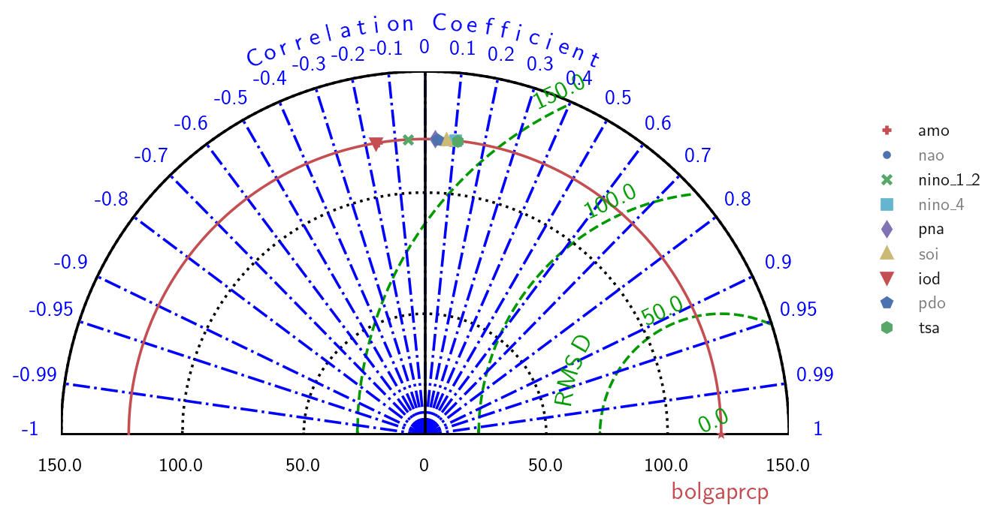

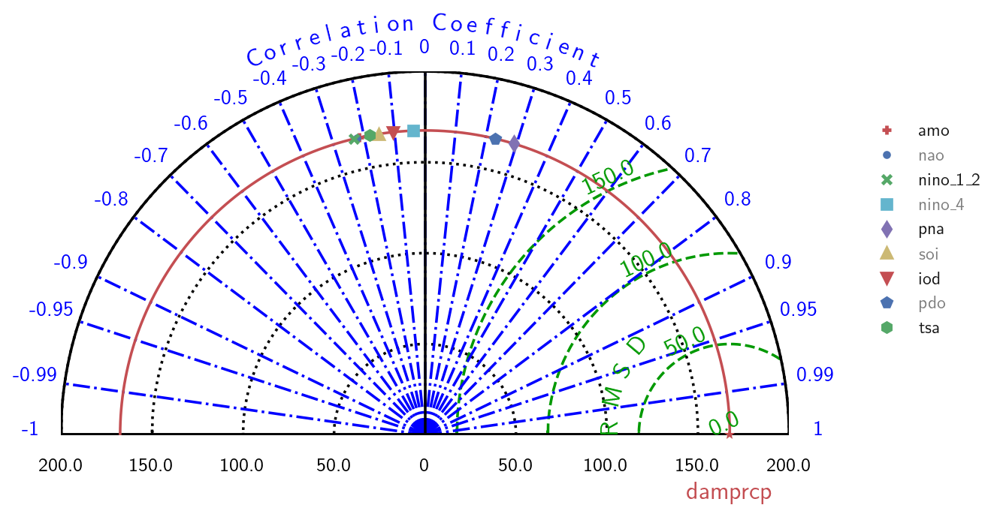

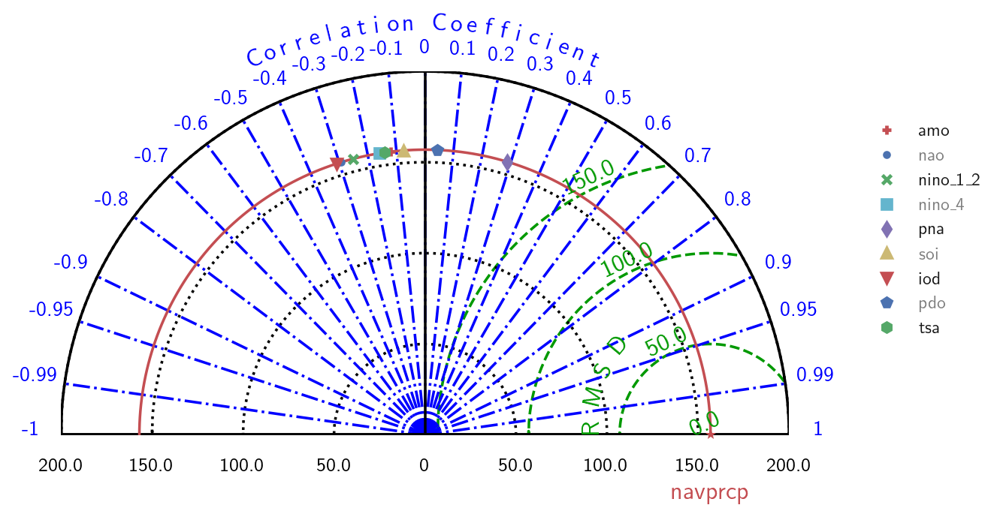

...

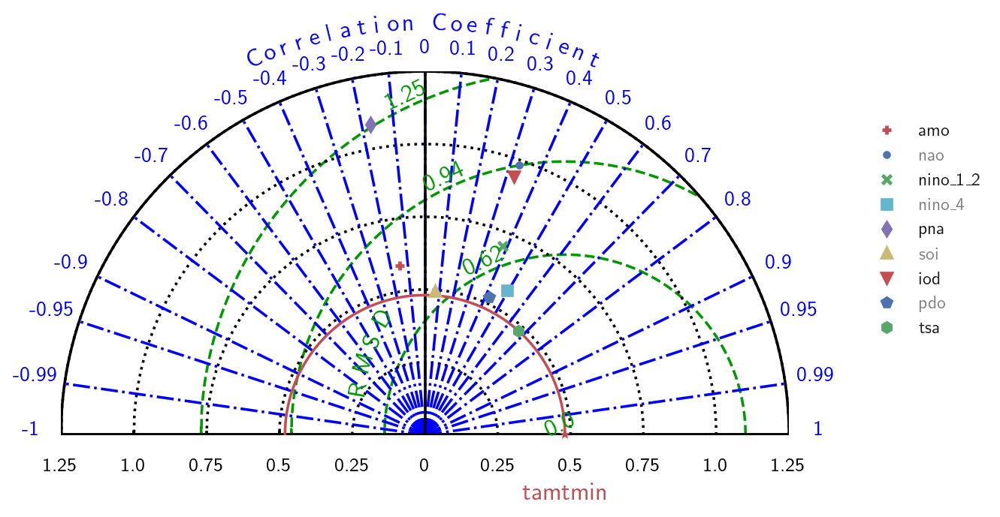

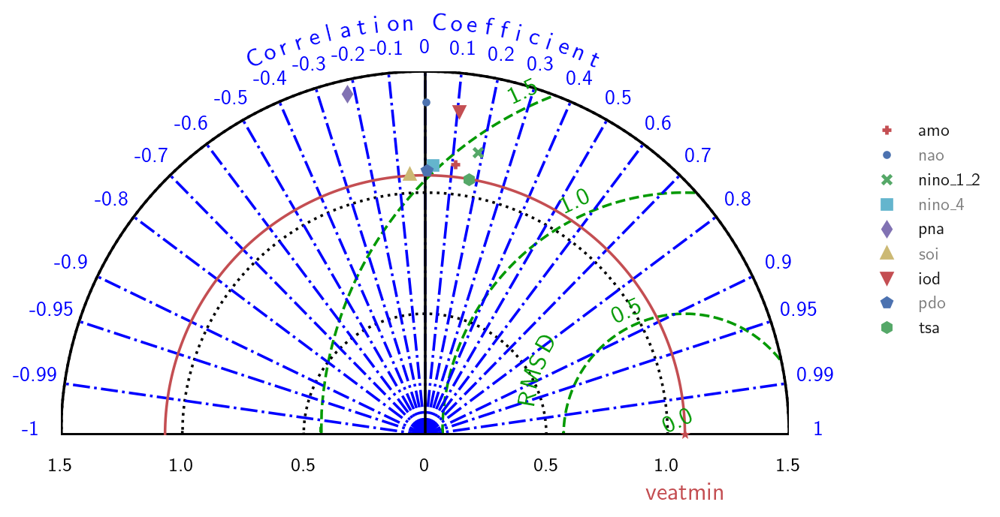

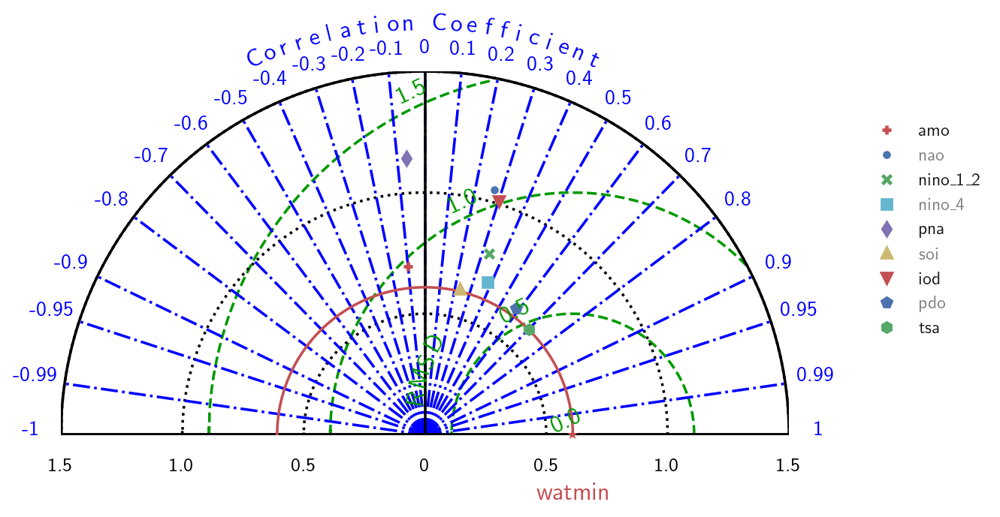

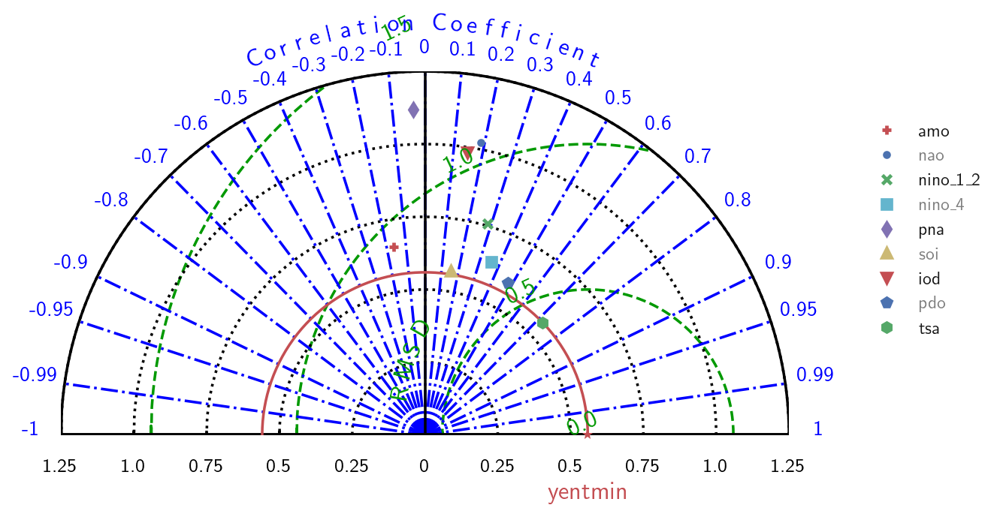

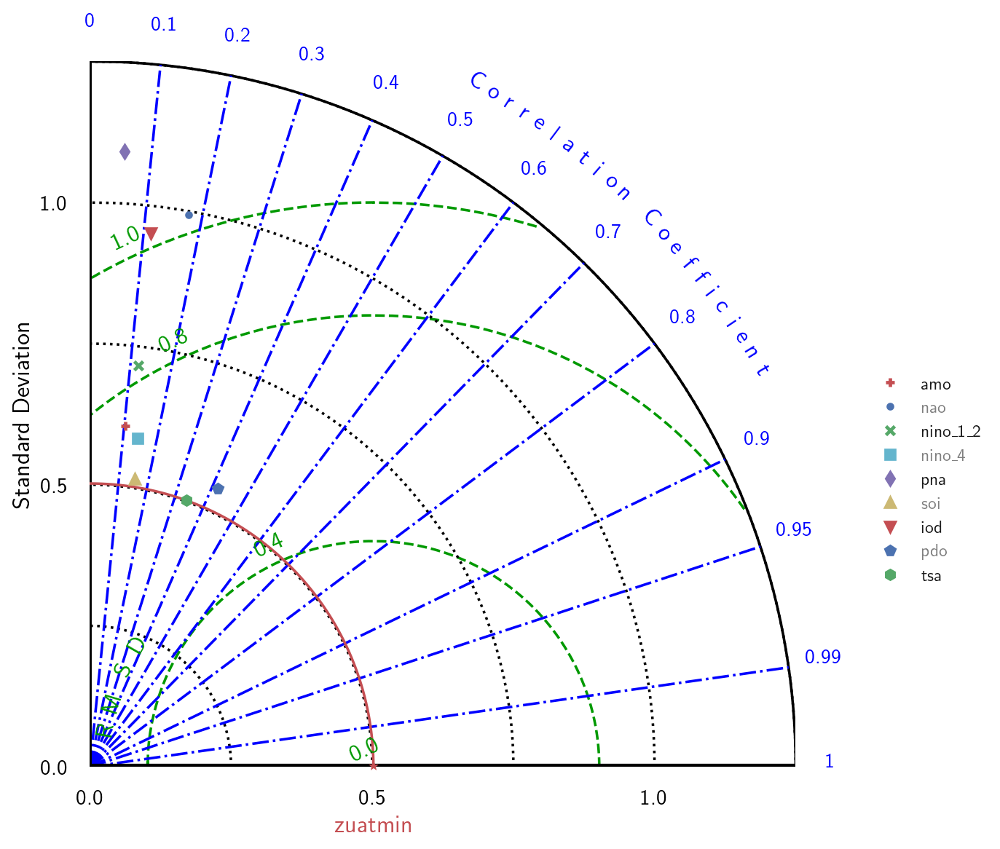

In [68]:
import skill_metrics as sm

'''
    Specify individual marker label (key), label color, symbol, size, symbol face color, 
    symbol edge color
    '''
Nz = 5
gk['bug'] = gk[gk.columns[0]]
MARKERS = {
        f"{gk.columns[0]}": {
            "labelColor": "k",
            "symbol": "+",
            "size": Nz,
            "faceColor": "r",
            "edgeColor": "r",
        },
        f"{gk.columns[1]}": {
            "labelColor": "gray",
            "symbol": ".",
            "size": Nz,
            "faceColor": "b",
            "edgeColor": "b",
        },
        f"{gk.columns[2]}": {
            "labelColor": "k",
            "symbol": "x",
            "size": Nz,
            "faceColor": "g",
            "edgeColor": "g",
        },
        f"{gk.columns[3]}": {
            "labelColor": "gray",
            "symbol": "s",
            "size": Nz,
            "faceColor": "c",
            "edgeColor": "c",
        },
        f"{gk.columns[4]}": {
            "labelColor": "k",
            "symbol": "d",
            "size": Nz,
            "faceColor": "m",
            "edgeColor": "m",
        },
        f"{gk.columns[5]}": {
            "labelColor": "gray",
            "symbol": "^",
            "size": Nz,
            "faceColor": "y",
            "edgeColor": "y",
        },
        f"{gk.columns[6]}": {
            "labelColor": "k",
            "symbol": "v",
            "size": Nz,
            "faceColor": "r",
            "edgeColor": "r",
        },
        f"{gk.columns[7]}": {
            "labelColor": "gray",
            "symbol": "p",
            "size": Nz,
            "faceColor": "b",
            "edgeColor": "b",
        },
        f"{gk.columns[8]}": {
            "labelColor": "k",
            "symbol": "h",
            "size": Nz,
            "faceColor": "g",
            "edgeColor": "g",
        },
        f"{gk.columns[9]}": {
            "labelColor": "gray",
            "symbol": "*",
            "size": Nz,
            "faceColor": "c",
            "edgeColor": "c",
        },
        # f"{gk.columns[10]}": {
        #     "labelColor": "k",
        #     "symbol": "+",
        #     "size": Nz,
        #     "faceColor": "m",
        #     "edgeColor": "m",
        # },
        # f"{gk.columns[11]}": {
        #     "labelColor": "gray",
        #     "symbol": ".",
        #     "size": Nz,
        #     "faceColor": "y",
        #     "edgeColor": "y",
        # },
        # f"{gk.columns[12]}": {
        #     "labelColor": "k",
        #     "symbol": "x",
        #     "size": Nz,
        #     "faceColor": "r",
        #     "edgeColor": "r",
        # },
        # f"{gk.columns[13]}": {
        #     "labelColor": "gray",
        #     "symbol": "*",
        #     "size": Nz,
        #     "faceColor": "y",
        #     "edgeColor": "y",
        # },
# ,
#         "16059": {
#             "labelColor": "k",
#             "symbol": "d",
#             "size": 9,
#             "faceColor": "g",
#             "edgeColor": "g",
#         },
#         "16060": {
#             "labelColor": "gray",
#             "symbol": "^",
#             "size": 9,
#             "faceColor": "c",
#             "edgeColor": "c",
#         },
#         "16066": {
#             "labelColor": "k",
#             "symbol": "v",
#             "size": 9,
#             "faceColor": "m",
#             "edgeColor": "m",
#         },
#         "16091": {
#             "labelColor": "gray",
#             "symbol": "p",
#             "size": 9,
#             "faceColor": "y",
#             "edgeColor": "y",
#         },
#         "17338": {
#             "labelColor": "k",
#             "symbol": "h",
#             "size": 9,
#             "faceColor": "r",
#             "edgeColor": "r",
#         },
#         "17364": {
#             "labelColor": "gray",
#             "symbol": "*",
#             "size": 9,
#             "faceColor": "b",
#             "edgeColor": "b",
#         },
#         "17365": {
#             "labelColor": "k",
#             "symbol": "+",
#             "size": 9,
#             "faceColor": "g",
#             "edgeColor": "g",
#         },
#         "17437": {
#             "labelColor": "gray",
#             "symbol": ".",
#             "size": 9,
#             "faceColor": "c",
#             "edgeColor": "c",
#         },
    }

for i, ck in enumerate([
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]):
    yt = df_cln[ck]


    ss = [co_standard_deviation(x_values=gk[c].values, y_values=yt) for c in list(gk.columns)]
    aa = [centered_root_mean_square_difference(x_values=gk[c].values, y_values=yt) for c in list(gk.columns)]
    cc = [correlation_coefficient(x_values=gk[c].values, y_values=yt) for c in list(gk.columns)]
    ss = np.array(ss)
    aa = np.array(aa)
    cc = np.array(cc)
    
    plt.figure(num=i+1, figsize=(12,8), dpi=170)
    if ck in [ 'zuaprcp', 'boleprcp', 'yenprcp' ]:
        Trms = [0.0, 70.0, 150.0, 200.0]
    elif ck in ['bolgaprcp', 'damprcp', 'veaprcp', 'navprcp', 'tamprcp', 'waprcp', 'babprcp']:
        Trms = [0.0, 50.0, 100.0, 150.0]
    elif ck in [ 'zuatmin']:
        Trms = [0.0, 0.4, 0.8, 1.0]
    elif ck in ['navtmin', 'watmax', 'tamtmin', 'damtmin', 'bolgatmin']:
        Trms = [0.0, 0.62, 0.94, 1.25]
    elif ck in ['yentmin','babtmax', 'navtmax', 'boletmax', 'watmin', 'veatmax', 'veatmin', 'boletmin', 'babtmin', 'zuatmax', 'yentmax']:
        Trms = [0.0, 0.5, 1.0, 1.5]
    else:
        Trms = [0.0, 1.0, 2.0, 3.0]
    
    ax = sm.taylor_diagram(ss, aa, cc, 
                           markers = MARKERS, 
                           markerLegend = 'on',
                           styleOBS = '-',
                           markerSymbol='*', 
                           titleOBS=f'{ck}', 
                           colOBS='r',
                           markerobs='*',
                           tickRMS = Trms,
                           tickRMSangle = 115, 
                           showlabelsRMS = 'on',
                          titleRMS = 'on',)
  
    # Show the plot
    plt.grid(False)
    # Save the figure as a PDF with higher resolution 
    plt.savefig(output_dir + '/' + f'{ck}_td.pdf', dpi=300, bbox_inches='tight', pad_inches=0.1, transparent=True)
    plt.savefig(output_dir + '/' + f'{ck}_td.png', dpi=300, bbox_inches='tight', pad_inches=0.1, transparent=True)
    plt.show()